<a href="https://colab.research.google.com/github/Jimbobaus/project---What-Watts---Group-A/blob/main/src/Sandpit_for_Capstone.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Sandpit for What Watts capstone project


In [1]:

!git clone https://github.com/Jimbobaus/project.git

Cloning into 'project'...
remote: Enumerating objects: 302, done.
remote: Counting objects: 100% (217/217), done.
remote: Compressing objects: 100% (175/175), done.
remote: Total 302 (delta 98), reused 108 (delta 42), pack-reused 85
Receiving objects: 100% (302/302), 165.89 MiB | 24.13 MiB/s, done.
Resolving deltas: 100% (119/119), done.
Checking out files: 100% (54/54), done.


In [2]:

# Fix: fatal: destination path 'project' already exists and is not an empty directory.
!git clone https://github.com/Jimbobaus/project.git temp
!cp temp/data/NSW\ Public\ Holidays.csv project/data
!ls project/data
# !mv temp/.git project/.git
# !rm -rf temp

Cloning into 'temp'...
remote: Enumerating objects: 302, done.
remote: Counting objects: 100% (217/217), done.
remote: Compressing objects: 100% (175/175), done.
remote: Total 302 (delta 98), reused 108 (delta 42), pack-reused 85
Receiving objects: 100% (302/302), 165.89 MiB | 24.36 MiB/s, done.
Resolving deltas: 100% (119/119), done.
Checking out files: 100% (54/54), done.
'ACT Per Month Installation.csv'
 forecastdemand_nsw.csv.zip.partaa
 forecastdemand_nsw.csv.zip.partab
'NSW Public Holidays.csv'
 PRICE_AND_DEMAND_202001_NSW1.csv
 PRICE_AND_DEMAND_NSW1.csv
 pv_Canterbury_2010-01-01-2021-04-30.csv
'PV Cumulative Installation NSW&ACT.csv'
 PVGenerationNSW-2012_032021.csv
 PVGenerationNSWACT-2012_032021.csv
'PVGenerationNSWACT-30+MW Excluded-2012_032021.csv'
'pv_St Ives_2019-01-01-2021-04-30.csv'
 pv_Sutherland_2019-01-01-2021-04-30.csv
 temperature_nsw.csv.zip
 totaldemand_nsw.csv.zip


In [3]:

# Create a data folder
!mkdir -p data
# Joint forecastdemand_nsw files into a single file. 
!cat project/data/forecastdemand_nsw.csv.zip.part* > data/forecastdemand_nsw.csv.zip

In [4]:

!cp data/forecastdemand_nsw.csv.zip /content/What

In [5]:

# Unzip the data files into the data folder
!unzip -o data/forecastdemand_nsw.csv.zip -d data
!unzip -o project/data/temperature_nsw.csv.zip -d data
!unzip -o project/data/totaldemand_nsw.csv.zip -d data

# Remove forecastdemand_nsw.csv.zip
!rm data/forecastdemand_nsw.csv.zip

Archive:  data/forecastdemand_nsw.csv.zip
  inflating: data/forecastdemand_nsw.csv  
Archive:  project/data/temperature_nsw.csv.zip
  inflating: data/temperature_nsw.csv  
Archive:  project/data/totaldemand_nsw.csv.zip
  inflating: data/totaldemand_nsw.csv  


In [6]:
import os
b = os.path.getsize("/content/data/forecastdemand_nsw.csv")
c = os.path.getsize("/content/data/temperature_nsw.csv")
d = os.path.getsize("/content/data/totaldemand_nsw.csv")
print (b,c,d)

739632904 6877450 5796284


# Import required libraries

In [7]:

import pandas as pd
import numpy as np
import seaborn as sns                       #visualisation
import matplotlib.pyplot as plt             #visualisation
%matplotlib inline     
sns.set(color_codes=True)
from plotnine import *

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, cross_val_predict, TimeSeriesSplit, RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier, export_text
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, classification_report, mean_squared_error, mean_absolute_error, r2_score
from sklearn import tree

import plotly.graph_objects as go

import xgboost as xgb
from xgboost import XGBRegressor

## Custom Functions for Metrics and Graph

In [8]:
# Error Metrics function 
# Creating an empty dict to save all the erros from different models
dict_error = dict()

def error_metrics(y_pred, y_truth, model_name = None, test = True):
    """
    Printing error metrics like RMSE (root mean square error), R2 score, 
    MAE (mean absolute error), MAPE (mean absolute % error). 
    
    y_pred: predicted values of y using the model model_name
    y_truth: observed values of y
    model_name: name of the model used for predictions
    test: if validating on test set, True; otherwise False for training set validation
    
    The function will print the RMSE, R2, MAE and MAPE error metrics for the model_name and also store the results along with 
    model_name in the dictionary dict_error so that we can compare all the models at the end.
    """
    if isinstance(y_pred, np.ndarray):
        y_pred = y_pred
    else:
        y_pred = y_pred.to_numpy()
        
    if isinstance(y_truth, np.ndarray):
        y_truth = y_truth
    else:
        y_truth = y_truth.to_numpy()
        
    print('\nError metrics for model {}'.format(model_name))
    
    RMSE = np.sqrt(mean_squared_error(y_truth, y_pred))
    print("RMSE or Root mean squared error: %.2f" % RMSE)
    
    # Explained variance score: 1 is perfect prediction

    R2 = r2_score(y_truth, y_pred)
    print('Variance score: %.2f' % R2 )

    MAE = mean_absolute_error(y_truth, y_pred)
    print('Mean Absolute Error: %.2f' % MAE)

    MAPE = (np.mean(np.abs((y_truth - y_pred) / y_truth)) * 100)
    print('Mean Absolute Percentage Error: %.2f %%' % MAPE)
    
    # Appending the error values along with the model_name to the dict
    if test:
        train_test = 'test'
    else:
        train_test = 'train'
    
    #df = pd.DataFrame({'model': model_name, 'RMSE':RMSE, 'R2':R2, 'MAE':MAE, 'MAPE':MAPE}, index=[0])
    name_error = ['model', 'train_test', 'RMSE', 'R2', 'MAE', 'MAPE']
    value_error = [model_name, train_test, RMSE, R2, MAE, MAPE]
    list_error = list(zip(name_error, value_error))
    
    for error in list_error:
        if error[0] in dict_error:
            # append the new number to the existing array at this slot
            dict_error[error[0]].append(error[1])
        else:
            # create a new array in this slot
            dict_error[error[0]] = [error[1]]
    #return(dict_error)


# function to Plot Graph 

def plot_ts_pred(og_ts, pred_ts, model_name=None, og_ts_opacity = 0.5, pred_ts_opacity = 0.5):
    """
    Plot plotly time series of the original (og_ts) and predicted (pred_ts) time series values to check how our model performs.
    model_name: name of the model used for predictions
    og_ts_opacity: opacity of the original time series
    pred_ts_opacity: opacity of the predicted time series
    """
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = og_ts.index, y = np.array(og_ts.values), name = "Observed",
                         line_color = 'darkblue', opacity = og_ts_opacity))

    try:
        fig.add_trace(go.Scatter(x = pred_ts.index, y = pred_ts, name = model_name,
                         line_color = 'orange', opacity = pred_ts_opacity))
    except: #if predicted values are a numpy array they won't have an index
        fig.add_trace(go.Scatter(x = og_ts.index, y = pred_ts, name = model_name,
                         line_color = 'orange', opacity = pred_ts_opacity))


    #fig.add_trace(go)
    fig.update_layout(title_text = 'Observed test set vs predicted energy MWH values using {}'.format(model_name),
                  xaxis_rangeslider_visible = True)
    fig.show()


# creating function for plotting predicted vs actual energy values
def plot_predvstrue_reg(pred, truth, model_name=None):
    """
    Plots the observed energy consumption against the predicted energy consumption
    """
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    ax.scatter(truth, pred) 
    _ = plt.xlabel("Observed energy in MWH")
    _ = plt.ylabel("Predicted energy in MWH")
    _ = plt.title("Observed vs Predicted energy using model {}".format(model_name))
    _ = plt.xlim(4000, 20000)
    _ = plt.ylim(4000, 20000)
    #plotting 45 deg line to see how the prediction differs from the observed values
    x = np.linspace(*ax.get_xlim())
    _ = ax.plot(x, x)

#Load data  into data frames

## Forecast Demand

In [9]:

df_forecast = pd.read_csv("/content/data/forecastdemand_nsw.csv")
# To display the top 5 rows 
df_forecast.tail(100)


#df_forecast.info()

,PREDISPATCHSEQNO,REGIONID,PERIODID,FORECASTDEMAND,LASTCHANGED,DATETIME
10905919,2021031711,NSW1,29,7048.49,2021-03-17 09:01:10,2021-03-17 23:30:00
10905920,2021031712,NSW1,28,7043.37,2021-03-17 09:31:04,2021-03-17 23:30:00
10905921,2021031713,NSW1,27,7044.67,2021-03-17 10:01:17,2021-03-17 23:30:00
10905922,2021031714,NSW1,26,7043.56,2021-03-17 10:31:09,2021-03-17 23:30:00
10905923,2021031715,NSW1,25,7043.46,2021-03-17 11:01:00,2021-03-17 23:30:00
...,...,...,...,...,...,...
10906014,2021031736,NSW1,5,7028.45,2021-03-17 21:31:31,2021-03-18 00:00:00
10906015,2021031737,NSW1,4,7041.65,2021-03-17 22:01:34,2021-03-18 00:00:00
10906016,2021031738,NSW1,3,7087.60,2021-03-17 22:31:36,2021-03-18 00:00:00
10906017,2021031739,NSW1,2,7087.28,2021-03-17 23:01:36,2021-03-18 00:00:00


## Temperature

In [10]:


df_temp = pd.read_csv("/content/data/temperature_nsw.csv")
# To display the top 5 rows 
df_temp.head(50)

#df_temp.info()

,LOCATION,DATETIME,TEMPERATURE
0,Bankstown,1/1/2010 0:00,23.1
1,Bankstown,1/1/2010 0:01,23.1
2,Bankstown,1/1/2010 0:30,22.9
3,Bankstown,1/1/2010 0:50,22.7
4,Bankstown,1/1/2010 1:00,22.6
5,Bankstown,1/1/2010 1:30,22.5
6,Bankstown,1/1/2010 2:00,22.5
7,Bankstown,1/1/2010 2:30,22.4
8,Bankstown,1/1/2010 3:00,22.3
9,Bankstown,1/1/2010 3:30,22.3


## Total Demand

In [11]:

df_totaldemand = pd.read_csv("/content/data/totaldemand_nsw.csv")
# To display the top 5 rows 
df_totaldemand.tail(50)
#df_totaldemand.loc['2021-03-03']
#df_totaldemand.info()

,DATETIME,TOTALDEMAND,REGIONID
196463,16/3/2021 23:30,7056.88,NSW1
196464,17/3/2021 0:00,6999.23,NSW1
196465,17/3/2021 0:30,6849.85,NSW1
196466,17/3/2021 1:00,6618.34,NSW1
196467,17/3/2021 1:30,6353.34,NSW1
196468,17/3/2021 2:00,6155.11,NSW1
196469,17/3/2021 2:30,5999.40,NSW1
196470,17/3/2021 3:00,5964.12,NSW1
196471,17/3/2021 3:30,5981.55,NSW1
196472,17/3/2021 4:00,6051.72,NSW1


In [12]:

df_totaldemand.dtypes
#df_totaldemand.REGIONID.unique() # NSW1 only

DATETIME        object
TOTALDEMAND    float64
REGIONID        object
dtype: object

In [13]:

df_temp.dtypes
#df_temp.LOCATION.unique() # Bankstown only

LOCATION        object
DATETIME        object
TEMPERATURE    float64
dtype: object

In [14]:

df_forecast.dtypes 
#df_forecast.REGIONID.unique() # NSW1 only     

PREDISPATCHSEQNO      int64
REGIONID             object
PERIODID              int64
FORECASTDEMAND      float64
LASTCHANGED          object
DATETIME             object
dtype: object

In [15]:

print(df_totaldemand.isnull().sum())
print(df_temp.isnull().sum())
print(df_forecast.isnull().sum())

DATETIME       0
TOTALDEMAND    0
REGIONID       0
dtype: int64
LOCATION       0
DATETIME       0
TEMPERATURE    0
dtype: int64
PREDISPATCHSEQNO    0
REGIONID            0
PERIODID            0
FORECASTDEMAND      0
LASTCHANGED         0
DATETIME            0
dtype: int64


In [16]:

print(df_totaldemand.count)
print(df_temp.count)
print(df_forecast.count)

<bound method DataFrame.count of                DATETIME  TOTALDEMAND REGIONID
0         1/1/2010 0:00      8038.00     NSW1
1         1/1/2010 0:30      7809.31     NSW1
2         1/1/2010 1:00      7483.69     NSW1
3         1/1/2010 1:30      7117.23     NSW1
4         1/1/2010 2:00      6812.03     NSW1
...                 ...          ...      ...
196508  17/3/2021 22:00      7419.77     NSW1
196509  17/3/2021 22:30      7417.91     NSW1
196510  17/3/2021 23:00      7287.32     NSW1
196511  17/3/2021 23:30      7172.39     NSW1
196512   18/3/2021 0:00      7094.51     NSW1

[196513 rows x 3 columns]>
<bound method DataFrame.count of          LOCATION         DATETIME  TEMPERATURE
0       Bankstown    1/1/2010 0:00         23.1
1       Bankstown    1/1/2010 0:01         23.1
2       Bankstown    1/1/2010 0:30         22.9
3       Bankstown    1/1/2010 0:50         22.7
4       Bankstown    1/1/2010 1:00         22.6
...           ...              ...          ...
220321  Bankstown 

# Load additional data

## Public Holiday Data

In [17]:
# Load data
df_publicholidays = pd.read_csv("/content/project/data/NSW Public Holidays.csv", header=0,infer_datetime_format=True,parse_dates=[['Year','Date']])
df_publicholidays.rename(columns={'Year_Date' :'DATETIME'},inplace=True)

df_publicholidays = df_publicholidays.loc[(df_publicholidays['DATETIME'].dt.year >= 2012)] # EXCLUDE PRE-2012 DATA


#df_publicholidays['DATE'] = df_publicholidays['DATETIME']
df_publicholidays['PUBLICHOLIDAYS'] = 1 # 10000 change scale from 1 to 10000 for plot
df_publicholidays = df_publicholidays.set_index(['DATETIME'])

# Drop unused columns
df_publicholidays.drop(['Day','Holiday', 'Type', 'Other'], axis = 1, inplace=True)

df_publicholidays_merge = df_publicholidays.resample('1D').mean()
df_publicholidays_merge['PUBLICHOLIDAYS'] = df_publicholidays_merge['PUBLICHOLIDAYS'].fillna(0)

df_publicholidays_merge = df_publicholidays_merge.resample('30min').ffill()
df_publicholidays_merge



,PUBLICHOLIDAYS
DATETIME,
2012-01-01 00:00:00,1.0
2012-01-01 00:30:00,1.0
2012-01-01 01:00:00,1.0
2012-01-01 01:30:00,1.0
2012-01-01 02:00:00,1.0
...,...
2021-04-01 22:00:00,0.0
2021-04-01 22:30:00,0.0
2021-04-01 23:00:00,0.0


In [18]:
df_publicholidays_merge.loc['2012-01-02']

,PUBLICHOLIDAYS
DATETIME,
2012-01-02 00:00:00,0.0
2012-01-02 00:30:00,0.0
2012-01-02 01:00:00,0.0
2012-01-02 01:30:00,0.0
2012-01-02 02:00:00,0.0
2012-01-02 02:30:00,0.0
2012-01-02 03:00:00,0.0
2012-01-02 03:30:00,0.0
2012-01-02 04:00:00,0.0


## Rooftop Solar PV Data
Need to take an average of PV Yield (kWh) every 30 minutes

### PV System Generation - Final PV dataset
Load one data set at a time, run and save results

#### NSW only

In [19]:
# df_pv = pd.read_csv("/content/project/data/PVGenerationNSW-2012_032021.csv") # NSW data


# # df_pv = pd.read_csv("/content/project/data/PVGenerationNSWACT-2012_032021.csv") # NSW & ACT  data
# # df_pv = pd.read_csv("/content/project/data/PVGenerationNSWACT-30+MW Excluded-2012_032021") # NSW & ACT  data, exclude > 30MW large scale solar

# # Format date time
# format = '%d/%m/%Y %H:%M'
# df_pv['DateTime'] = pd.to_datetime(df_pv['DateTime'], format=format)
# df_pv = df_pv.set_index(pd.DatetimeIndex(df_pv['DateTime']))

# # Rename index column
# # df_pv.rename(columns={'DateTime' :'DATETIME'},inplace=True)
# df_pv.rename_axis("DATETIME", axis='index', inplace=True)

# # Drop columns, only need PVGeneration(MW)
# df_pv.drop(['DateTime','Date', 'Time', 'Nearest BOM station temperature (C)','PV Yield KWh (5KWp System)','NSWTotalSize(MW)'], axis= 1, inplace= True)


# df_pv

#### NSW & ACT data

In [20]:
# df_pv = pd.read_csv("/content/project/data/PVGenerationNSWACT-2012_032021.csv") # NSW & ACT  data
# format = '%Y/%m/%d %H:%M'

# # df_pv = pd.read_csv("/content/project/data/PVGenerationNSWACT-30+MW Excluded-2012_032021") # NSW & ACT  data, exclude > 30MW large scale solar

# # Format date time
# df_pv['DateTime'] = pd.to_datetime(df_pv['DateTime'], format=format)
# df_pv = df_pv.set_index(pd.DatetimeIndex(df_pv['DateTime']))

# # Rename index column
# # df_pv.rename(columns={'DateTime' :'DATETIME'},inplace=True)
# df_pv.rename_axis("DATETIME", axis='index', inplace=True)

# # Drop columns, only need PVGeneration(MW)
# df_pv.drop(['DateTime'], axis= 1, inplace= True)


# df_pv

#### NSW & ACT Data Exclude > 30MW Large Scale Solar

In [21]:
 df_pv = pd.read_csv("/content/project/data/PVGenerationNSWACT-30+MW Excluded-2012_032021.csv") # NSW & ACT  data, exclude > 30MW large scale solar

# Format date time
format = '%Y/%m/%d %H:%M'
df_pv['DateTime'] = pd.to_datetime(df_pv['DateTime'], format=format)
df_pv = df_pv.set_index(pd.DatetimeIndex(df_pv['DateTime']))

# Rename index column
# df_pv.rename(columns={'DateTime' :'DATETIME'},inplace=True)
df_pv.rename_axis("DATETIME", axis='index', inplace=True)

# Drop columns, only need PVGeneration(MW)
df_pv.drop(['DateTime'], axis= 1, inplace= True)


df_pv

,PVGeneration(MW)
DATETIME,
2012-01-01 00:00:00,0
2012-01-01 00:30:00,0
2012-01-01 01:00:00,0
2012-01-01 01:30:00,0
2012-01-01 02:00:00,0
...,...
2021-03-31 21:30:00,0
2021-03-31 22:00:00,0
2021-03-31 22:30:00,0


### Price data
Download - https://aemo.com.au/energy-systems/electricity/national-electricity-market-nem/data-nem/aggregated-data

https://aemo.com.au/en/energy-systems/electricity/national-electricity-market-nem/data-nem/data-dashboard-nem
Note: Can't use price data as it is an output of the process. 

In [22]:
# df_price = pd.read_csv("/content/project/data/PRICE_AND_DEMAND_NSW1.csv") 

# # Format date time
# format = '%Y/%m/%d %H:%M:%S'
# df_price['DateTime'] = pd.to_datetime(df_price['SETTLEMENTDATE'], format=format)
# df_price = df_price.set_index(pd.DatetimeIndex(df_price['DateTime']))

# # Rename index column
# # df_price.rename(columns={'DateTime' :'DATETIME'},inplace=True)
# df_price.rename_axis("DATETIME", axis='index', inplace=True)

# # Drop columns, only need PVGeneration(MW)
# df_price.drop(['DateTime','REGION','SETTLEMENTDATE','TOTALDEMAND','PERIODTYPE'], axis= 1, inplace= True)
# df_price

In [23]:
# df_price = pd.read_csv("/content/project/data/PRICE_AND_DEMAND_202001_NSW1.csv") 

# # Format date time
# format = '%Y/%m/%d %H:%M:%S'
# df_price['DateTime'] = pd.to_datetime(df_price['SETTLEMENTDATE'], format=format)
# df_price = df_price.set_index(pd.DatetimeIndex(df_price['DateTime']))

# # Rename index column
# # df_price.rename(columns={'DateTime' :'DATETIME'},inplace=True)
# df_price.rename_axis("DATETIME", axis='index', inplace=True)

# # Drop columns, only need PVGeneration(MW)
# df_price.drop(['DateTime','REGION','SETTLEMENTDATE','TOTALDEMAND','PERIODTYPE'], axis= 1, inplace= True)
# df_price

# EDA Pre-Transformation

## Forecast Demand

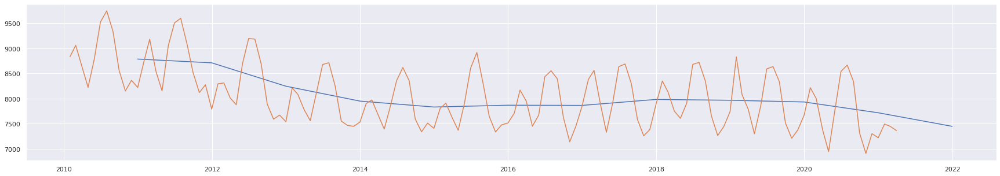

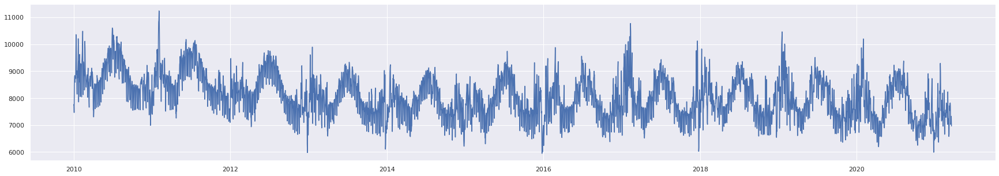

In [24]:
# Commented out as run too long
# This read_csv will truncate time so create as a new dataframe
df_forecast_eda =pd.read_csv("/content/data/forecastdemand_nsw.csv",header=0,infer_datetime_format=True,parse_dates=['DATETIME'],index_col=['DATETIME'])
#df_forecast_eda.head(10)

# Plot resampling by month and year
df_forecast_eda_eda_year =df_forecast_eda.resample('Y').mean()
plt.figure(figsize=(30,5))
plt.plot(df_forecast_eda_eda_year['FORECASTDEMAND'])

df_forecast_eda_eda_month =df_forecast_eda.resample('M').mean()
#plt.figure(figsize=(30,10))
plt.plot(df_forecast_eda_eda_month['FORECASTDEMAND'])

# Plot resampling by day
df_forecast_eda_eda_day =df_forecast_eda.resample('D').mean()


plt.figure(figsize=(30,5))
plt.plot(df_forecast_eda_eda_day['FORECASTDEMAND'])
#df_forecast_eda_eda_day.head(10)



## Temperature

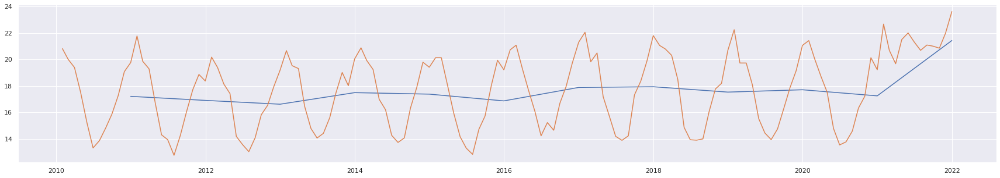

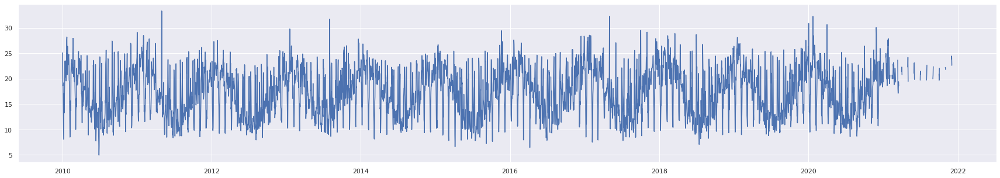

In [25]:
# Commented out as run too long
# This read_csv will truncate time so create as a new dataframe
df_temp_eda =pd.read_csv("/content/data/temperature_nsw.csv",header=0,infer_datetime_format=True,parse_dates=['DATETIME'],index_col=['DATETIME'])
df_temp_eda.head(10)
# Plot resampling by month and year
df_temp_eda_eda_year =df_temp_eda.resample('Y').mean()
plt.figure(figsize=(30,5))
plt.plot(df_temp_eda_eda_year['TEMPERATURE'])

df_temp_eda_eda_month =df_temp_eda.resample('M').mean()
#plt.figure(figsize=(30,10))
plt.plot(df_temp_eda_eda_month['TEMPERATURE'])

# Plot resampling by day
df_temp_eda_eda_day =df_temp_eda.resample('D').mean()
plt.figure(figsize=(30,5))
plt.plot(df_temp_eda_eda_day['TEMPERATURE'])

## Total Demand

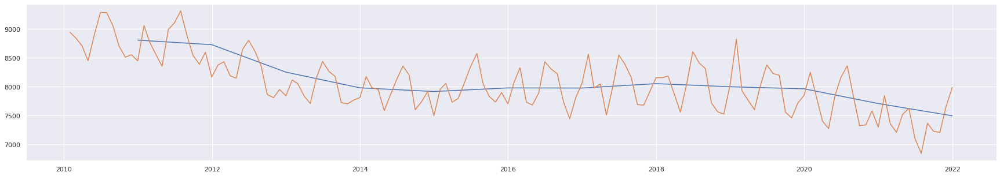

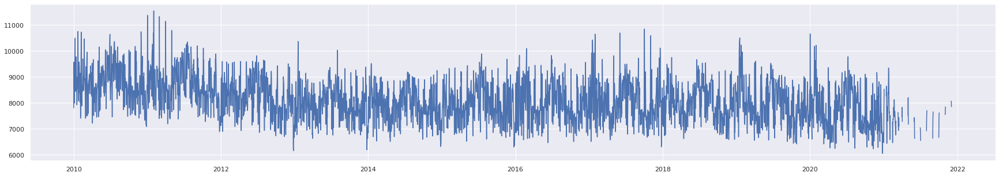

In [26]:
# Commented out as run too long
# This read_csv will truncate time so create as a new dataframe
df_totaldemand_eda =pd.read_csv("/content/data/totaldemand_nsw.csv",header=0,infer_datetime_format=True,parse_dates=['DATETIME'],index_col=['DATETIME'])

# Plot resampling by month and year
df_totaldemand_eda_eda_year =df_totaldemand_eda.resample('Y').mean()
plt.figure(figsize=(30,5))
plt.plot(df_totaldemand_eda_eda_year['TOTALDEMAND'])

df_totaldemand_eda_eda_month =df_totaldemand_eda.resample('M').mean()
#plt.figure(figsize=(30,10))
plt.plot(df_totaldemand_eda_eda_month['TOTALDEMAND'])

# Plot resampling by day
df_totaldemand_eda_eda_day =df_totaldemand_eda.resample('D').mean()
plt.figure(figsize=(30,5))
plt.plot(df_totaldemand_eda_eda_day['TOTALDEMAND'])

## Boxplot to find outliers
For any outliers, may need to replace with NaN (subject to further investigation)

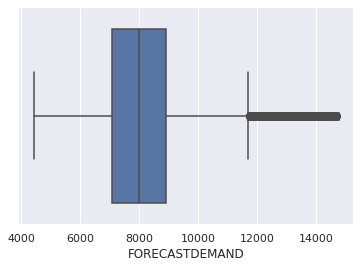

In [27]:

sns.boxplot(x=df_forecast['FORECASTDEMAND'])
plt.show()

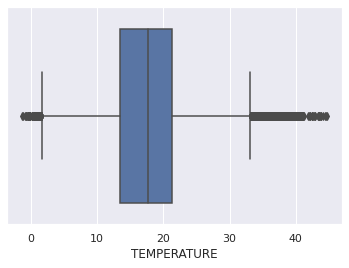

In [28]:

sns.boxplot(x=df_temp['TEMPERATURE'])
plt.show()

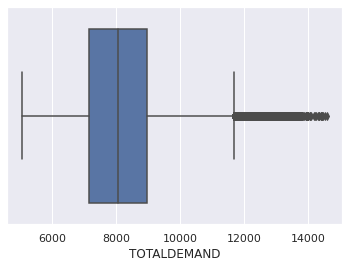

In [29]:

sns.boxplot(x=df_totaldemand['TOTALDEMAND'])
plt.show()

## Histogram 

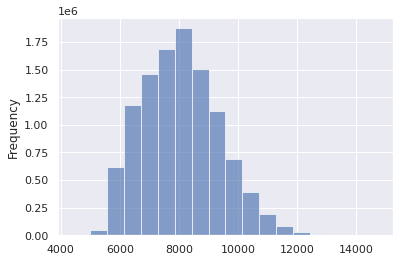

In [30]:

ax = df_forecast['FORECASTDEMAND'].plot.hist(bins=18, alpha=0.65)

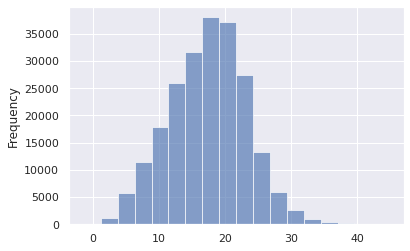

In [31]:

ax = df_temp['TEMPERATURE'].plot.hist(bins=18, alpha=0.65)

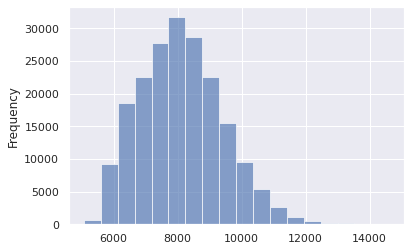

In [32]:

ax = df_totaldemand['TOTALDEMAND'].plot.hist(bins=18, alpha=0.65)

## Distribution

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Forecast Demand Distribution')

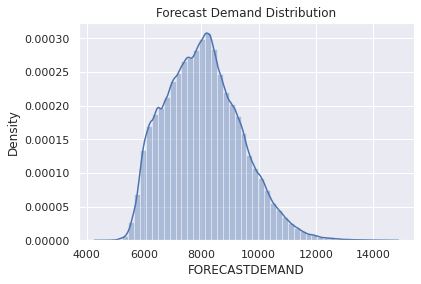

In [33]:

sns.distplot(df_forecast["FORECASTDEMAND"])
plt.title("Forecast Demand Distribution")

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Temperature Distribution')

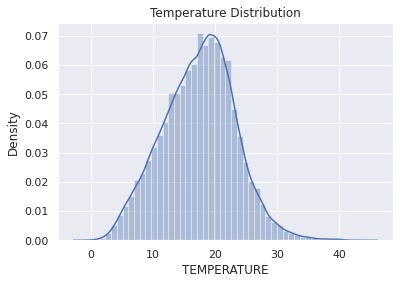

In [34]:

sns.distplot(df_temp["TEMPERATURE"])
plt.title("Temperature Distribution")

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



Text(0.5, 1.0, 'Total Demand Distribution')

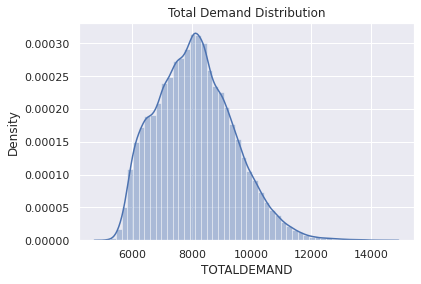

In [35]:

sns.distplot(df_totaldemand["TOTALDEMAND"])
plt.title("Total Demand Distribution")

# Transformation
Transformation includes following:
* Set datetime column as an index
* Convert datetime column from string to date time
* Splitting date and time columns
* Adding month, year, day name, week
* Adding public holidays (currently data.gov h as only far back to 2014, not 2010)

## Forecast Demand
* Filter to use only data form year 2012 onwards

### Main Transformation

In [36]:

# df_forecast = pd.read_csv("/content/data/forecastdemand_nsw.csv")

# Adding date, time, month, year, day for Forecast data
df_forecast['DATETIME'] = pd.to_datetime(df_forecast['DATETIME'])
df_forecast['Date'] = df_forecast['DATETIME'].dt.date
df_forecast['Time'] = df_forecast['DATETIME'].dt.time
df_forecast['Hour'] = df_forecast['DATETIME'].dt.hour  # Hour minute feautre to forecast this as categorical
df_forecast['Hour'] =  df_forecast['Hour'].astype(str)
df_forecast['Minute'] = df_forecast['DATETIME'].dt.minute
df_forecast['MINUTE_CAT'] = df_forecast['Minute'] 
df_forecast['Minute'] =  df_forecast['Minute'].astype(str)
df_forecast['HOURMINUTE'] = df_forecast['Hour'] + '-' + df_forecast['Minute']
df_forecast['Year'] = df_forecast['DATETIME'].dt.year 
df_forecast['Month'] = pd.to_numeric(df_forecast['DATETIME'].dt.month)
df_forecast['Day'] = df_forecast['DATETIME'].dt.day
df_forecast['Day_Name'] = df_forecast['DATETIME'].dt.day_name()
df_forecast['DayOfWeek'] = pd.to_numeric(df_forecast['DATETIME'].dt.dayofweek)
df_forecast = df_forecast.set_index(['DATETIME'])

### Filter data from Year 2012 onwards 
Filter data form Year 2018 onwards as only need 2 years of recent data to train and 1 year to test

In [37]:

# Filter to use only data from year 2012 onwards
# df_forecast = df_forecast.loc[(df_forecast['Year'] >= 2018) & (df_forecast['Year'] <= 2020)] # No need to train from 2021, only need 2 yrs recent data
# df_forecast = df_forecast.loc[(df_forecast['Year'] >= 2020)] # No need to train from 2021, only need 2 yrs recent data including 2021
df_forecast = df_forecast.loc[(df_forecast['Year'] >= 2018) & (df_forecast['Year'] <= 2021)] #  need 2 yrs recent data plus 2021
#df_forecast.tail(10)
#df_forecast.loc['2020-03-01']
df_forecast
#df_forecast.loc['2020-03'].groupby(['Date','REGIONID','Year','Month','Day']).mean()

,PREDISPATCHSEQNO,REGIONID,PERIODID,FORECASTDEMAND,LASTCHANGED,Date,Time,Hour,Minute,MINUTE_CAT,HOURMINUTE,Year,Month,Day,Day_Name,DayOfWeek
DATETIME,,,,,,,,,,,,,,,,
2018-01-01,2017123018,NSW1,71,6580.63,2017-12-30 12:31:25,2018-01-01,00:00:00,0,0,0,0-0,2018,1,1,Monday,0
2018-01-01,2017123019,NSW1,70,6577.49,2017-12-30 13:01:32,2018-01-01,00:00:00,0,0,0,0-0,2018,1,1,Monday,0
2018-01-01,2017123020,NSW1,69,6575.97,2017-12-30 13:31:23,2018-01-01,00:00:00,0,0,0,0-0,2018,1,1,Monday,0
2018-01-01,2017123021,NSW1,68,6582.40,2017-12-30 14:01:30,2018-01-01,00:00:00,0,0,0,0-0,2018,1,1,Monday,0
2018-01-01,2017123022,NSW1,67,6582.72,2017-12-30 14:31:18,2018-01-01,00:00:00,0,0,0,0-0,2018,1,1,Monday,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-18,2021031736,NSW1,5,7028.45,2021-03-17 21:31:31,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3
2021-03-18,2021031737,NSW1,4,7041.65,2021-03-17 22:01:34,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3
2021-03-18,2021031738,NSW1,3,7087.60,2021-03-17 22:31:36,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3


### Weekday Weekend (Categorical data) 

In [38]:
# # AFTER VIF THIS FEATURE IS NOT SIGNIFICANT SO COMMENTED OUT.
# # Adding & Grouping weekday, weekend to categorical column
# def weekday_weekend_list(df) :
#     if df['DayOfWeek'] <= 4 :
#         return 'weekday'
#     else:
#         return 'weekend'

# df_forecast['weekday_weekend'] = df_forecast.apply(lambda df_forecast:weekday_weekend_list(df_forecast), axis=1)

# # Drop tenture original before grouping column
# # df_forecast.drop("DayOfWeek", axis= 1, inplace= True)

# df_forecast

### Seasons (Categorical data)

In [39]:
# # AFTER VIF THIS FEATURE IS SIGNIFICANT.
# Adding & Grouping seasons categorical columns
def season_list(df) :
    if (3 <= df['Month']) & (df['Month'] <= 5) :
        return 'autumn'
    if (6 <= df['Month']) & (df['Month'] <= 8) :
        return 'winter'
    if (9 <= df['Month']) & (df['Month'] <= 11) :
        return 'spring'        
    else:
        return 'summer'

df_forecast['SEASON'] = df_forecast.apply(lambda df_forecast:season_list(df_forecast), axis=1)

# Drop tenture original before grouping column
# df_forecast.drop("DayOfWeek", axis= 1, inplace= True)

df_forecast

#ggplot(df_forecast, aes(x='Day_Name', y='FORECASTDEMAND', color = 'Year')) + geom_point()

,PREDISPATCHSEQNO,REGIONID,PERIODID,FORECASTDEMAND,LASTCHANGED,Date,Time,Hour,Minute,MINUTE_CAT,HOURMINUTE,Year,Month,Day,Day_Name,DayOfWeek,SEASON
DATETIME,,,,,,,,,,,,,,,,,
2018-01-01,2017123018,NSW1,71,6580.63,2017-12-30 12:31:25,2018-01-01,00:00:00,0,0,0,0-0,2018,1,1,Monday,0,summer
2018-01-01,2017123019,NSW1,70,6577.49,2017-12-30 13:01:32,2018-01-01,00:00:00,0,0,0,0-0,2018,1,1,Monday,0,summer
2018-01-01,2017123020,NSW1,69,6575.97,2017-12-30 13:31:23,2018-01-01,00:00:00,0,0,0,0-0,2018,1,1,Monday,0,summer
2018-01-01,2017123021,NSW1,68,6582.40,2017-12-30 14:01:30,2018-01-01,00:00:00,0,0,0,0-0,2018,1,1,Monday,0,summer
2018-01-01,2017123022,NSW1,67,6582.72,2017-12-30 14:31:18,2018-01-01,00:00:00,0,0,0,0-0,2018,1,1,Monday,0,summer
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-18,2021031736,NSW1,5,7028.45,2021-03-17 21:31:31,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3,autumn
2021-03-18,2021031737,NSW1,4,7041.65,2021-03-17 22:01:34,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3,autumn
2021-03-18,2021031738,NSW1,3,7087.60,2021-03-17 22:31:36,2021-03-18,00:00:00,0,0,0,0-0,2021,3,18,Thursday,3,autumn


### Minute 0 or 30 minute (Categorical data) 
* Minute O'clock and half (0 or 30 minute) vs non 0 or 30 minute (Categorical data) 

In [40]:
# # # AFTER VIF THIS FEATURE IS NOT SIGNIFICANT SO COMMENTED OUT.
# # Adding 0 or 30 minutes to categorical column
# def oclock_list(df) :
#     if df['MINUTE_CAT'] == 0 :
#         return 'oclock'
#     elif df['MINUTE_CAT'] == 30 :
#         return 'oclock'
#     else:
#         return 'non_oclock'


# df_forecast['OCLOCK'] = df_forecast.apply(lambda df_forecast:oclock_list(df_forecast), axis=1)

# df_forecast

In [41]:

df_forecast['2020-03-13']

,PREDISPATCHSEQNO,REGIONID,PERIODID,FORECASTDEMAND,LASTCHANGED,Date,Time,Hour,Minute,MINUTE_CAT,HOURMINUTE,Year,Month,Day,Day_Name,DayOfWeek,SEASON
DATETIME,,,,,,,,,,,,,,,,,
2020-03-13 00:00:00,2020031118,NSW1,71,7168.21,2020-03-11 12:31:26,2020-03-13,00:00:00,0,0,0,0-0,2020,3,13,Friday,4,autumn
2020-03-13 00:00:00,2020031119,NSW1,70,7167.83,2020-03-11 13:01:29,2020-03-13,00:00:00,0,0,0,0-0,2020,3,13,Friday,4,autumn
2020-03-13 00:00:00,2020031120,NSW1,69,7162.23,2020-03-11 13:31:33,2020-03-13,00:00:00,0,0,0,0-0,2020,3,13,Friday,4,autumn
2020-03-13 00:00:00,2020031121,NSW1,68,7184.59,2020-03-11 14:01:22,2020-03-13,00:00:00,0,0,0,0-0,2020,3,13,Friday,4,autumn
2020-03-13 00:00:00,2020031122,NSW1,67,7186.39,2020-03-11 14:31:23,2020-03-13,00:00:00,0,0,0,0-0,2020,3,13,Friday,4,autumn
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-03-13 23:30:00,2020031335,NSW1,5,7333.51,2020-03-13 21:01:12,2020-03-13,23:30:00,23,30,30,23-30,2020,3,13,Friday,4,autumn
2020-03-13 23:30:00,2020031336,NSW1,4,7315.28,2020-03-13 21:31:21,2020-03-13,23:30:00,23,30,30,23-30,2020,3,13,Friday,4,autumn
2020-03-13 23:30:00,2020031337,NSW1,3,7291.52,2020-03-13 22:01:14,2020-03-13,23:30:00,23,30,30,23-30,2020,3,13,Friday,4,autumn


## Temperature

In [42]:

#df_temp = pd.read_csv("/content/data/temperature_nsw.csv")

#df_temp = df_temp_eda 
#df_temp

# Format date time
format = '%d/%m/%Y %H:%M'
df_temp['DATETIME'] = pd.to_datetime(df_temp['DATETIME'], format=format)
df_temp = df_temp.set_index(pd.DatetimeIndex(df_temp['DATETIME']))

df_temp

# Adding date, time for rollup before merge
# df_temp['DATETIME'] = pd.to_datetime(df_temp['DATETIME'])
df_temp['Date'] = df_temp['DATETIME'].dt.date
df_temp['Time'] = df_temp['DATETIME'].dt.time
df_temp['Hour'] = df_temp['DATETIME'].dt.hour
df_temp['Minute'] = df_temp['DATETIME'].dt.minute
# df_temp = df_temp.set_index(['DATETIME'])
df_temp

,LOCATION,DATETIME,TEMPERATURE,Date,Time,Hour,Minute
DATETIME,,,,,,,
2010-01-01 00:00:00,Bankstown,2010-01-01 00:00:00,23.1,2010-01-01,00:00:00,0,0
2010-01-01 00:01:00,Bankstown,2010-01-01 00:01:00,23.1,2010-01-01,00:01:00,0,1
2010-01-01 00:30:00,Bankstown,2010-01-01 00:30:00,22.9,2010-01-01,00:30:00,0,30
2010-01-01 00:50:00,Bankstown,2010-01-01 00:50:00,22.7,2010-01-01,00:50:00,0,50
2010-01-01 01:00:00,Bankstown,2010-01-01 01:00:00,22.6,2010-01-01,01:00:00,1,0
...,...,...,...,...,...,...,...
2021-03-17 23:00:00,Bankstown,2021-03-17 23:00:00,19.1,2021-03-17,23:00:00,23,0
2021-03-17 23:20:00,Bankstown,2021-03-17 23:20:00,19.0,2021-03-17,23:20:00,23,20
2021-03-17 23:30:00,Bankstown,2021-03-17 23:30:00,18.8,2021-03-17,23:30:00,23,30


### High Medium Low Temperature (Categorical data)

In [43]:
# # AFTER VIF THIS FEATURE IS SIGNIFICANT SO TO ADD EXTREME HIGH AND LOW.
## This should be done after resample
# # Adding & Grouping seasons categorical columns
# def temp_list(df) :
#     if (df['TEMPERATURE'] < 10) :
#         return "verylow" #'1 very low'
#     if (df['TEMPERATURE'] >= 10) & (df['TEMPERATURE'] < 20) :
#         return "low" #'2 low'
#     if (df['TEMPERATURE'] >= 20) & (df['TEMPERATURE'] < 30) :
#         return "high" #'3 high'
#     else:
#         return "veryhigh" #'3 very high >= 30'

# df_temp['TEMPERATURERANGES'] = df_temp.apply(lambda df_temp:temp_list(df_temp), axis=1)

# df_temp

In [44]:

# # Adding & Grouping seasons categorical columns
# def temp_list(df) :
#     if (df['TEMPERATURE'] < 10) :
#         return 1 #'low'
#     if (df['TEMPERATURE'] > 30) :
#         return 3 #'high'
#     else:
#         return 2 #'medium'

# df_temp['TEMPERATURERANGES'] = df_temp.apply(lambda df_temp:temp_list(df_temp), axis=1)

# df_temp

## Total Demand

In [45]:

#df_totaldemand = df_totaldemand_eda

#df_totaldemand = pd.read_csv("/content/data/totaldemand_nsw.csv")
# Format date time
format = '%d/%m/%Y %H:%M'
df_totaldemand['DATETIME'] = pd.to_datetime(df_totaldemand['DATETIME'], format=format)
#df_totaldemand = df_totaldemand.set_index(pd.DatetimeIndex(df_totaldemand['DATETIME']))
df_totaldemand = df_totaldemand.set_index(['DATETIME'])

df_totaldemand

,TOTALDEMAND,REGIONID
DATETIME,,
2010-01-01 00:00:00,8038.00,NSW1
2010-01-01 00:30:00,7809.31,NSW1
2010-01-01 01:00:00,7483.69,NSW1
2010-01-01 01:30:00,7117.23,NSW1
2010-01-01 02:00:00,6812.03,NSW1
...,...,...
2021-03-17 22:00:00,7419.77,NSW1
2021-03-17 22:30:00,7417.91,NSW1
2021-03-17 23:00:00,7287.32,NSW1


# Merge all dataframes
To merge 3 dataframes into one dataframe, below tranformation required when merge.
From: 2010-01-01
To: 2021-03-18

1. Forecast demand
* Data with date time every 30 minutes, multiple data points for each time
* The last data point to be taken
2. Temperature
* Data with date time every 30 minutes (some inconsistent), multiple data points for each time
* Average data to be taken
3. Total demand
* Data with date time every 30 minutes

## Forecast Demand
Rollup to get last changed per date time

In [46]:

# Before Merge
#df_forecast_merge = df_forecast.loc['2020-03-01']
df_forecast_merge = df_forecast

# Multiple data poitns pick only the last one using over partition rank by periodid

df_forecast_merge['rank_periodid'] = df_forecast_merge.groupby('DATETIME')['PERIODID'].rank(method='first')

df_forecast_merge = df_forecast_merge[df_forecast_merge['rank_periodid']==1]
df_forecast_merge

,PREDISPATCHSEQNO,REGIONID,PERIODID,FORECASTDEMAND,LASTCHANGED,Date,Time,Hour,Minute,MINUTE_CAT,HOURMINUTE,Year,Month,Day,Day_Name,DayOfWeek,SEASON,rank_periodid
DATETIME,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,2017123140,NSW1,1,7094.57,2017-12-31 23:31:08,2018-01-01,00:00:00,0,0,0,0-0,2018,1,1,Monday,0,summer,1.0
2018-01-01 00:30:00,2017123141,NSW1,1,6910.43,2018-01-01 00:01:20,2018-01-01,00:30:00,0,30,30,0-30,2018,1,1,Monday,0,summer,1.0
2018-01-01 01:00:00,2017123142,NSW1,1,6706.53,2018-01-01 00:31:15,2018-01-01,01:00:00,1,0,0,1-0,2018,1,1,Monday,0,summer,1.0
2018-01-01 01:30:00,2017123143,NSW1,1,6533.87,2018-01-01 01:01:09,2018-01-01,01:30:00,1,30,30,1-30,2018,1,1,Monday,0,summer,1.0
2018-01-01 02:00:00,2017123144,NSW1,1,6317.65,2018-01-01 01:31:03,2018-01-01,02:00:00,2,0,0,2-0,2018,1,1,Monday,0,summer,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-17 22:00:00,2021031736,NSW1,1,7409.33,2021-03-17 21:31:31,2021-03-17,22:00:00,22,0,0,22-0,2021,3,17,Wednesday,2,autumn,1.0
2021-03-17 22:30:00,2021031737,NSW1,1,7422.63,2021-03-17 22:01:34,2021-03-17,22:30:00,22,30,30,22-30,2021,3,17,Wednesday,2,autumn,1.0
2021-03-17 23:00:00,2021031738,NSW1,1,7313.13,2021-03-17 22:31:36,2021-03-17,23:00:00,23,0,0,23-0,2021,3,17,Wednesday,2,autumn,1.0


## Temperature
Rollup for non 00:00 or 00:30:  
between 00:00 and < 00:30 => 00:00 
between 00:30 and < 00:59 => 00:30 

In [47]:

#df_temp = pd.read_csv("/content/data/temperature_nsw.csv")
#df_temp =pd.read_csv("/content/data/temperature_nsw.csv",header=0,infer_datetime_format=True,parse_dates=['DATETIME'],index_col=['DATETIME'])


# # Format date time
# format = '%d/%m/%Y %H:%M'
# df_temp['DATETIME'] = pd.to_datetime(df_temp['DATETIME'], format=format)
# df_temp = df_temp.set_index(pd.DatetimeIndex(df_temp['DATETIME']))

# df_temp



In [48]:
# Temperatureranges has not been used here because it has no mean!!!
df_temp_merge = df_temp.resample('30min').mean() # This will also added new rows when missing time interval

df_temp_merge.dtypes

TEMPERATURE    float64
Hour           float64
Minute         float64
dtype: object

### High Medium Low Temperature (Categorical data)
Need to do after re-sample to every 30mins; otherwise, it won't add this column.


In [49]:
# AFTER VIF THIS FEATURE IS SIGNIFICANT SO TO ADD EXTREME HIGH AND LOW.
# Adding & Grouping seasons categorical columns
def temp_list(df) :
    if (df['TEMPERATURE'] < 10) :
        return "verylow" #'1 very low'
    if (df['TEMPERATURE'] >= 10) & (df['TEMPERATURE'] < 20) :
        return "low" #'2 low'
    if (df['TEMPERATURE'] >= 20) & (df['TEMPERATURE'] < 30) :
        return "high" #'3 high'
    if (df['TEMPERATURE'] >= 30) & (df['TEMPERATURE'] < 35) :
        return "veryhigh" #'4 very high'  
    # if (df['TEMPERATURE'] < 5) :
        # return "extremelylow" #'5 extremely low'                   
    else:
        return "extremelyhigh" #'6 extremely high >= 35'

df_temp_merge['TEMPERATURERANGES'] = df_temp_merge.apply(lambda df_temp_merge:temp_list(df_temp_merge), axis=1)

df_temp_merge

,TEMPERATURE,Hour,Minute,TEMPERATURERANGES
DATETIME,,,,
2010-01-01 00:00:00,23.10,0.0,0.5,high
2010-01-01 00:30:00,22.80,0.0,40.0,high
2010-01-01 01:00:00,22.60,1.0,0.0,high
2010-01-01 01:30:00,22.50,1.0,30.0,high
2010-01-01 02:00:00,22.50,2.0,0.0,high
...,...,...,...,...
2021-03-17 22:00:00,19.70,22.0,0.0,low
2021-03-17 22:30:00,19.50,22.0,30.0,low
2021-03-17 23:00:00,19.05,23.0,10.0,low


In [50]:
# # AFTER VIF THIS FEATURE IS SIGNIFICANT SO TO ADD EXTREME HIGH AND LOW.
# # Adding & Grouping seasons categorical columns
# def temp_list(df) :
#     if (df['TEMPERATURE'] >= 5)  & (df['TEMPERATURE'] < 10) :
#         return "verylow" #'1 very low'
#     if (df['TEMPERATURE'] >= 10) & (df['TEMPERATURE'] < 20) :
#         return "low" #'2 low'
#     if (df['TEMPERATURE'] >= 20) & (df['TEMPERATURE'] < 30) :
#         return "high" #'3 high'
#     if (df['TEMPERATURE'] >= 30) & (df['TEMPERATURE'] < 35) :
#         return "veryhigh" #'4 very high'  
#     if (df['TEMPERATURE'] < 5) :
#         return "extremelylow" #'5 extremely low'                   
#     else:
#         return "extremelyhigh" #'6 extremely high >= 35'

# df_temp_merge['TEMPERATURERANGES'] = df_temp_merge.apply(lambda df_temp_merge:temp_list(df_temp_merge), axis=1)

# df_temp_merge

In [51]:
df_temp_merge 

,TEMPERATURE,Hour,Minute,TEMPERATURERANGES
DATETIME,,,,
2010-01-01 00:00:00,23.10,0.0,0.5,high
2010-01-01 00:30:00,22.80,0.0,40.0,high
2010-01-01 01:00:00,22.60,1.0,0.0,high
2010-01-01 01:30:00,22.50,1.0,30.0,high
2010-01-01 02:00:00,22.50,2.0,0.0,high
...,...,...,...,...
2021-03-17 22:00:00,19.70,22.0,0.0,low
2021-03-17 22:30:00,19.50,22.0,30.0,low
2021-03-17 23:00:00,19.05,23.0,10.0,low


## Merge 

In [52]:

# # Merge all dataframes into the final dataframe

#df_forecast_merge = df_forecast.loc['2020-03-01']
# dfs = [df_forecast_merge, df_temp_merge, df_totaldemand, df_publicholidays_merge]
dfs = [df_forecast_merge, df_temp_merge, df_totaldemand, df_publicholidays_merge, df_pv]
# dfs = [df_forecast_merge, df_temp_merge, df_totaldemand, df_publicholidays_merge, df_pv, df_price]

# dfs = [df_forecast_merge, df_publicholidays_merge]
#dfs = [df_forecast_merge, df_temp_merge]
#dfs = [df_temp, df_totaldemand]

df_final = df_forecast_merge

for df in dfs:
    df_final = df_final.merge(df, on=['DATETIME'], how='outer')
    
#df_final.columns

In [53]:
df_final

,PREDISPATCHSEQNO_x,REGIONID_x,PERIODID_x,FORECASTDEMAND_x,LASTCHANGED_x,Date_x,Time_x,Hour_x,Minute_x,MINUTE_CAT_x,HOURMINUTE_x,Year_x,Month_x,Day_x,Day_Name_x,DayOfWeek_x,SEASON_x,rank_periodid_x,PREDISPATCHSEQNO_y,REGIONID_y,PERIODID_y,FORECASTDEMAND_y,LASTCHANGED_y,Date_y,Time_y,Hour_y,Minute_y,MINUTE_CAT_y,HOURMINUTE_y,Year_y,Month_y,Day_y,Day_Name_y,DayOfWeek_y,SEASON_y,rank_periodid_y,TEMPERATURE,Hour,Minute,TEMPERATURERANGES,TOTALDEMAND,REGIONID,PUBLICHOLIDAYS,PVGeneration(MW)
DATETIME,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,2.017123e+09,NSW1,1.0,7094.57,2017-12-31 23:31:08,2018-01-01,00:00:00,0,0,0.0,0-0,2018.0,1.0,1.0,Monday,0.0,summer,1.0,2.017123e+09,NSW1,1.0,7094.57,2017-12-31 23:31:08,2018-01-01,00:00:00,0,0,0.0,0-0,2018.0,1.0,1.0,Monday,0.0,summer,1.0,22.40,0.0,0.0,high,7034.74,NSW1,1.0,0.0
2018-01-01 00:30:00,2.017123e+09,NSW1,1.0,6910.43,2018-01-01 00:01:20,2018-01-01,00:30:00,0,30,30.0,0-30,2018.0,1.0,1.0,Monday,0.0,summer,1.0,2.017123e+09,NSW1,1.0,6910.43,2018-01-01 00:01:20,2018-01-01,00:30:00,0,30,30.0,0-30,2018.0,1.0,1.0,Monday,0.0,summer,1.0,22.35,0.0,32.0,high,6912.25,NSW1,1.0,0.0
2018-01-01 01:00:00,2.017123e+09,NSW1,1.0,6706.53,2018-01-01 00:31:15,2018-01-01,01:00:00,1,0,0.0,1-0,2018.0,1.0,1.0,Monday,0.0,summer,1.0,2.017123e+09,NSW1,1.0,6706.53,2018-01-01 00:31:15,2018-01-01,01:00:00,1,0,0.0,1-0,2018.0,1.0,1.0,Monday,0.0,summer,1.0,22.40,1.0,0.0,high,6745.63,NSW1,1.0,0.0
2018-01-01 01:30:00,2.017123e+09,NSW1,1.0,6533.87,2018-01-01 01:01:09,2018-01-01,01:30:00,1,30,30.0,1-30,2018.0,1.0,1.0,Monday,0.0,summer,1.0,2.017123e+09,NSW1,1.0,6533.87,2018-01-01 01:01:09,2018-01-01,01:30:00,1,30,30.0,1-30,2018.0,1.0,1.0,Monday,0.0,summer,1.0,22.40,1.0,30.0,high,6466.06,NSW1,1.0,0.0
2018-01-01 02:00:00,2.017123e+09,NSW1,1.0,6317.65,2018-01-01 01:31:03,2018-01-01,02:00:00,2,0,0.0,2-0,2018.0,1.0,1.0,Monday,0.0,summer,1.0,2.017123e+09,NSW1,1.0,6317.65,2018-01-01 01:31:03,2018-01-01,02:00:00,2,0,0.0,2-0,2018.0,1.0,1.0,Monday,0.0,summer,1.0,22.30,2.0,0.0,high,6279.80,NSW1,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-01 22:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
2021-04-01 22:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
2021-04-01 23:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN


### Add working day or non working day categorical data

In [54]:
# # # AFTER VIF THIS FEATURE IS NOT SIGNIFICANT SO COMMENTED  OUT.
# # Adding & Grouping working, non-working data to categorical column
# def public_holidays_list(df) :
#     if df['PUBLICHOLIDAYS'] == 1 or df['weekday_weekend_x'] == "weekend":
#         return 'non_working'
#     else:
#         return 'working'

# # df_forecast_merge['WORKINGDAY'] = df_forecast_merge.apply(lambda df_forecast_merge:public_holidays_list(df_forecast_merge), axis=1)

# df_final['WORKINGDAY'] = df_final.apply(lambda df_final:public_holidays_list(df_final), axis=1)

# # Drop original before grouping column
# # df_forecast.drop("DayOfWeek", axis= 1, inplace= True)

# df_final

### Drop unused columns

In [55]:

# Drop unused columns
df_final.drop(['FORECASTDEMAND_y','PREDISPATCHSEQNO_x', 'REGIONID_x', 'PERIODID_x', 'LASTCHANGED_x', 'rank_periodid_x', 
         'PREDISPATCHSEQNO_y', 'REGIONID_y', 'PERIODID_y','LASTCHANGED_y','Date_y',
         'Time_y', 'Year_y','Month_y', 'Day_y','Day_Name_y','rank_periodid_y','REGIONID', 'DayOfWeek_x','DayOfWeek_y',
         'Hour_x','Minute_x', 'Hour_y','Minute_y','HOURMINUTE_y', 'SEASON_y','MINUTE_CAT_y'], axis = 1, inplace=True) 

# Rename columns
df_final = df_final.rename({'FORECASTDEMAND_x':'FORECASTDEMAND', 'Date_x':'DATE', 'Time_x':'TIME', 'Year_x':'YEAR', 'Month_x':'MONTH', 
                 'Day_x':'DAY', 'Day_Name_x':'DAY_NAME', 'MINUTE_CAT_x':'MINUTE_CAT', 'Hour':'HOUR','Minute':'MINUTE',
                 'HOURMINUTE_x':'HOURMINUTE', 'SEASON_x':'SEASON'}, axis='columns')

df_final

,FORECASTDEMAND,DATE,TIME,MINUTE_CAT,HOURMINUTE,YEAR,MONTH,DAY,DAY_NAME,SEASON,TEMPERATURE,HOUR,MINUTE,TEMPERATURERANGES,TOTALDEMAND,PUBLICHOLIDAYS,PVGeneration(MW)
DATETIME,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,7094.57,2018-01-01,00:00:00,0.0,0-0,2018.0,1.0,1.0,Monday,summer,22.40,0.0,0.0,high,7034.74,1.0,0.0
2018-01-01 00:30:00,6910.43,2018-01-01,00:30:00,30.0,0-30,2018.0,1.0,1.0,Monday,summer,22.35,0.0,32.0,high,6912.25,1.0,0.0
2018-01-01 01:00:00,6706.53,2018-01-01,01:00:00,0.0,1-0,2018.0,1.0,1.0,Monday,summer,22.40,1.0,0.0,high,6745.63,1.0,0.0
2018-01-01 01:30:00,6533.87,2018-01-01,01:30:00,30.0,1-30,2018.0,1.0,1.0,Monday,summer,22.40,1.0,30.0,high,6466.06,1.0,0.0
2018-01-01 02:00:00,6317.65,2018-01-01,02:00:00,0.0,2-0,2018.0,1.0,1.0,Monday,summer,22.30,2.0,0.0,high,6279.80,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-04-01 22:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
2021-04-01 22:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
2021-04-01 23:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN


#### DIFF Demand


In [56]:

# Plot resampling by month and year
df_final['DIFFDEMAND'] = df_final['TOTALDEMAND'] - df_final['FORECASTDEMAND']


# EDA Public Holidays

## Total Demand

In [57]:

# # Plot resampling by day
# df_totaldemand_eda_eda_day =df_totaldemand_eda.resample('D').mean()
# plt.figure(figsize=(300,50))
# plt.plot(df_totaldemand_eda_eda_day['TOTALDEMAND'])
# # plt.figure(figsize=(30,5))
# plt.plot(df_publicholidays['PUBLICHOLIDAYS'], 'o')


## Forecast Demand

In [58]:

# # Plot resampling by day
# df_forecast_bushfire =df_forecast_eda.resample('D').mean()
# plt.figure(figsize=(300,50))
# plt.plot(df_forecast_eda_eda_day['FORECASTDEMAND'])
# # plt.figure(figsize=(30,5))
# plt.plot(df_publicholidays['PUBLICHOLIDAYS'], 'o')

# EDA Correlation
1. Temp v forcast demand
2. Temp v total demand
3. Temp v total - forcast
4. Time series of total - forcast

## Heatmap

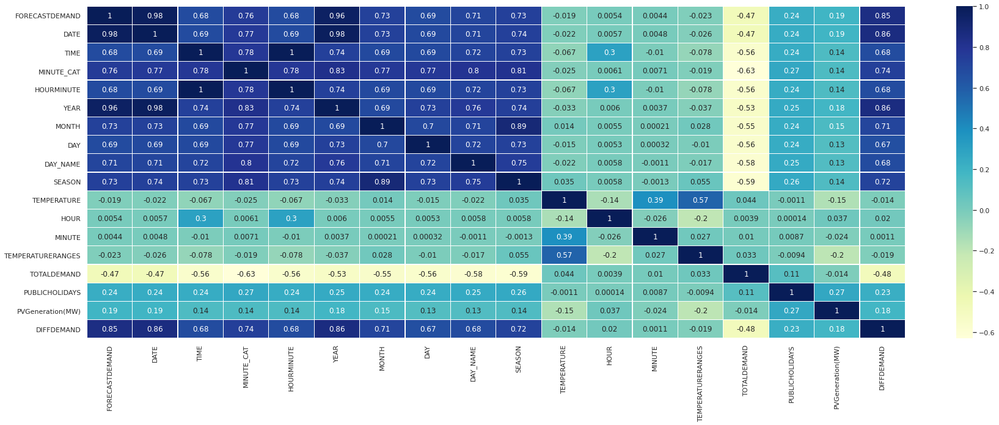

In [59]:

# Correlation betwen features
plt.figure(figsize=(30, 10))
corr = df_final.apply(lambda x: pd.factorize(x)[0]).corr()
ax = sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, linewidths=.2, cmap="YlGnBu", annot=True)

## Temperature


### Temperature vs Total Demand

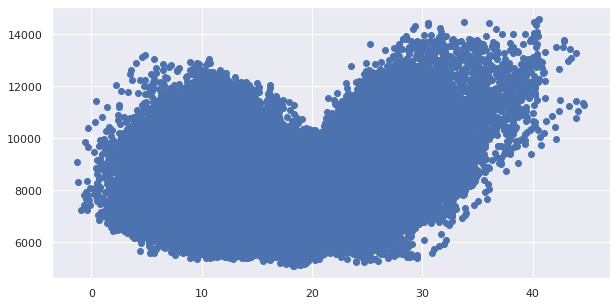

In [60]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['TEMPERATURE'],df_final['TOTALDEMAND'])

### Temperature vs Forecast Demand

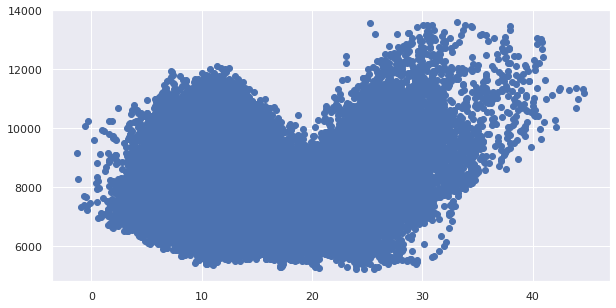

In [61]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['TEMPERATURE'],df_final['FORECASTDEMAND'])

### Temperature vs Total - Forecast


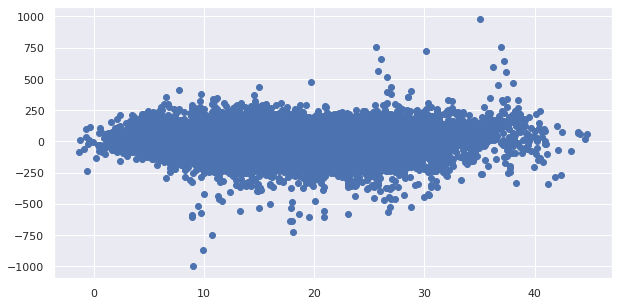

In [62]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['TEMPERATURE'],df_final['TOTALDEMAND']-df_final['FORECASTDEMAND'])
#plt.scatter(df_final['TEMPERATURE'],df_final_eda['DIFFDEMAND'])

## Weekday-Weekend


### Weekday-Weekend vs Total Demand

In [63]:

# plt.figure(figsize=(10,5))
# plt.scatter(df_final['WEEKDAY_WEEKEND'],df_final['TOTALDEMAND'])

### Weekday-Weekend vs Forecast Demand

In [64]:

# plt.figure(figsize=(10,5))
# plt.scatter(df_final['WEEKDAY_WEEKEND'],df_final['FORECASTDEMAND'])

### Weekday-Weekend vs Total - Forecast

In [65]:

# plt.figure(figsize=(10,5))
# plt.scatter(df_final['WEEKDAY_WEEKEND'],df_final['TOTALDEMAND']-df_final['FORECASTDEMAND'])
# #plt.scatter(df_final['TEMPERATURE'],df_final_eda['DIFFDEMAND'])

## Month

### Month vs Total Demand

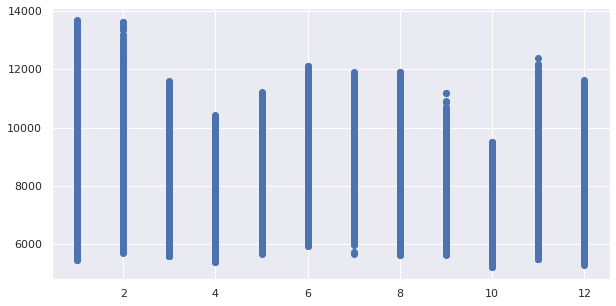

In [66]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['MONTH'],df_final['TOTALDEMAND'])

### Month vs Forecast Demand

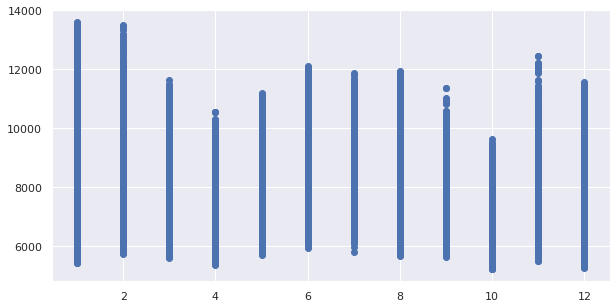

In [67]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['MONTH'],df_final['FORECASTDEMAND'])

### Month vs Total - Forecast

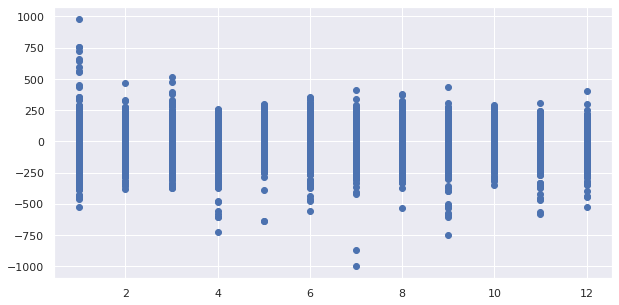

In [68]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['MONTH'],df_final['TOTALDEMAND']-df_final['FORECASTDEMAND'])
#plt.scatter(df_final['TEMPERATURE'],df_final_eda['DIFFDEMAND'])

## Hours

### Hours vs Total Demand

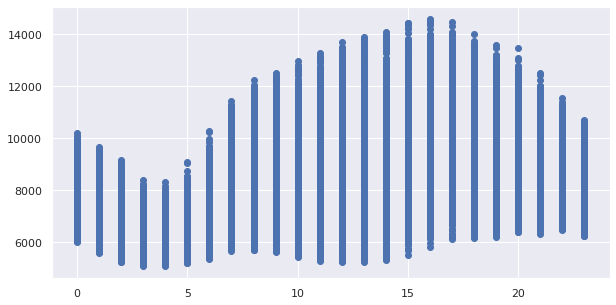

In [69]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['HOUR'],df_final['TOTALDEMAND'])

### Hours vs Forecast Demand

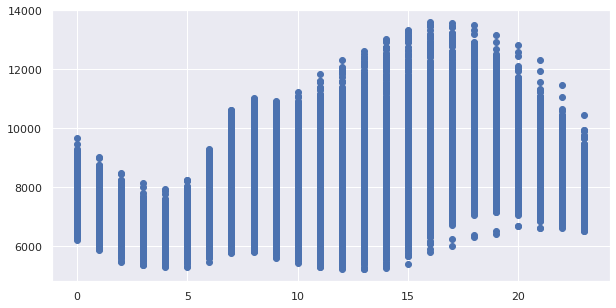

In [70]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['HOUR'],df_final['FORECASTDEMAND'])

### Hours vs Total - Forecast

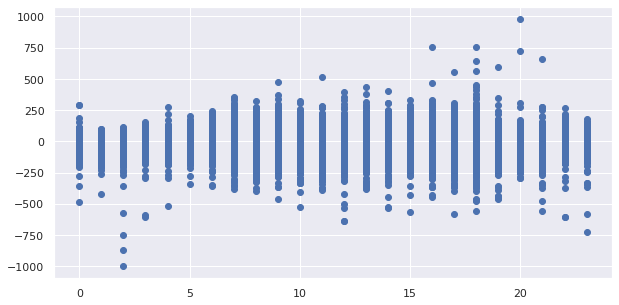

In [71]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['HOUR'],df_final['TOTALDEMAND']-df_final['FORECASTDEMAND'])
#plt.scatter(df_final['TEMPERATURE'],df_final_eda['DIFFDEMAND'])

## Minutes

### Minutes vs Total Demand

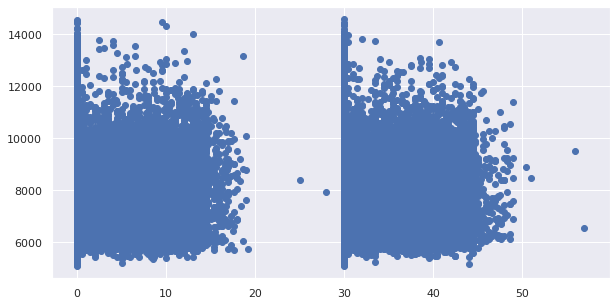

In [72]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['MINUTE'],df_final['TOTALDEMAND'])

### Minutes vs Forecast Demand

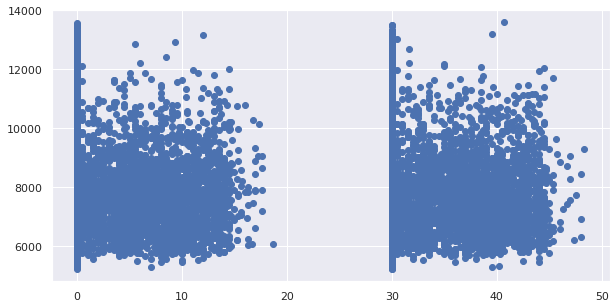

In [73]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['MINUTE'],df_final['FORECASTDEMAND'])

### Minutes vs Total - Forecast Demand

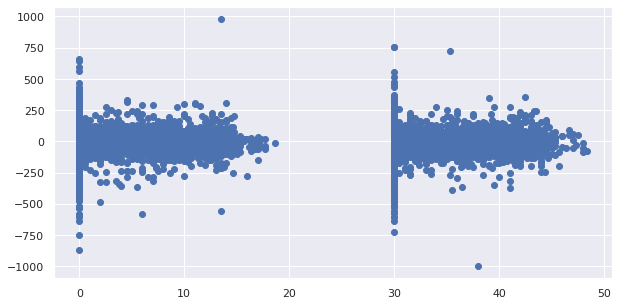

In [74]:

plt.figure(figsize=(10,5))
plt.scatter(df_final['MINUTE'],df_final['TOTALDEMAND']-df_final['FORECASTDEMAND'])
#plt.scatter(df_final['TEMPERATURE'],df_final_eda['DIFFDEMAND'])

## Time Series Diff Demand (Total Demand - Forecast Demand) 
Note:
* Algorithm changed in 2012

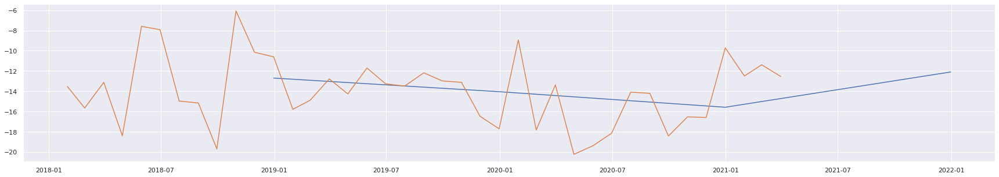

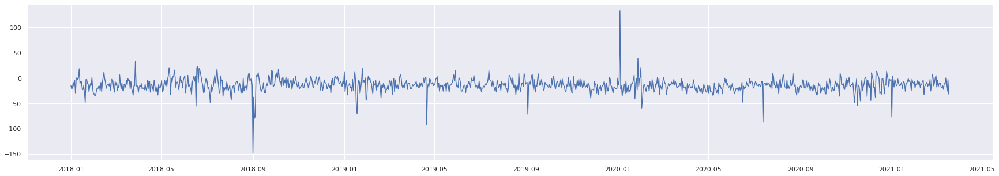

In [75]:

df_final_eda = df_final
df_final_eda_year = df_final_eda.resample('Y').mean()

plt.figure(figsize=(30,5))
plt.plot(df_final_eda_year['DIFFDEMAND'])

df_final_eda_eda_month =df_final_eda.resample('M').mean()
#plt.figure(figsize=(30,10))
plt.plot(df_final_eda_eda_month['DIFFDEMAND'])

# Plot resampling by day
df_final_eda_eda_day =df_final_eda.resample('D').mean()
plt.figure(figsize=(30,5))
plt.plot(df_final_eda_eda_day['DIFFDEMAND'])

## Regression

### Total Demand

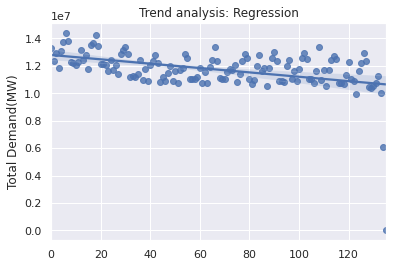

In [76]:

# Resampling per month
df_totaldemand_mon = df_final.TOTALDEMAND.resample("M").agg(sum).to_frame("TOTALDEMAND")
df_totaldemand_mon["ix"] = range(0, len(df_totaldemand_mon))
df_totaldemand_mon[:5]

# Regression plot
sns.regplot(data=df_totaldemand_mon,x="ix", y="TOTALDEMAND")
plt.title("Trend analysis: Regression")
plt.ylabel("Total Demand(MW)")
plt.xlabel("")
plt.show()

### Forecast Demand

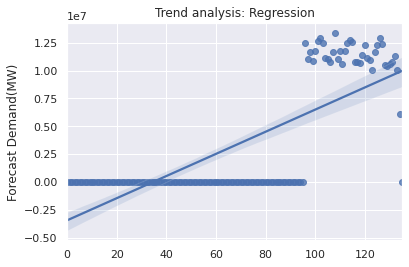

In [77]:

# Resampling per month
df_forecast_mon = df_final.FORECASTDEMAND.resample("M").agg(sum).to_frame("FORECASTDEMAND")
df_forecast_mon["ix"] = range(0, len(df_forecast_mon))
df_forecast_mon[:5]

# Regression plot
sns.regplot(data=df_forecast_mon,x="ix", y="FORECASTDEMAND")
plt.title("Trend analysis: Regression")
plt.ylabel("Forecast Demand(MW)")
plt.xlabel("")
plt.show()

## Boxplot

## Boxplot to find outliers Diff Demand for the report

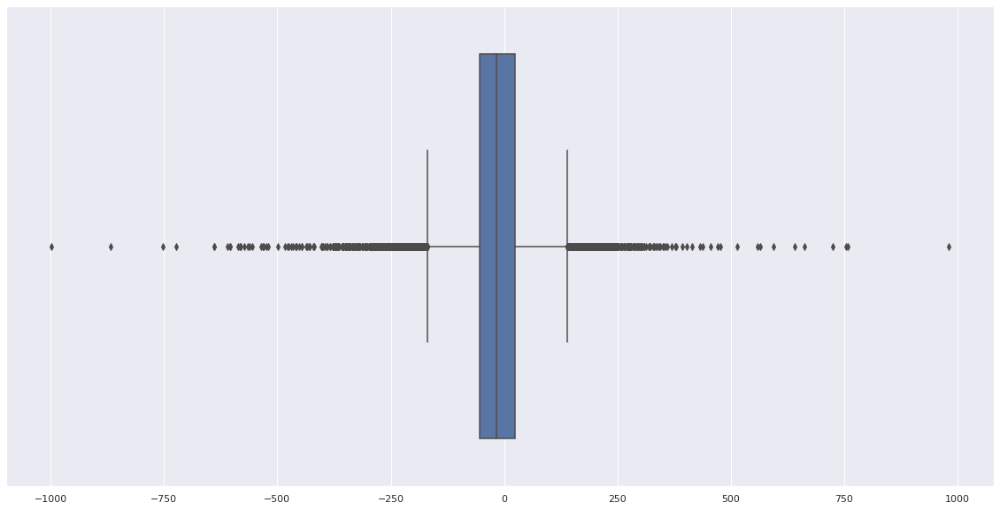

In [138]:
plt.figure(figsize=(20,10))
sns.boxplot(x=(df_final['TOTALDEMAND'] - df_final['FORECASTDEMAND']))
plt.show()

### Per Year

In [78]:
# Take too long so commented out
# sns.boxplot(data=df_final["2010":"2021"], x="YEAR", y="TOTALDEMAND")
# plt.title("Trend Analysis: Annual Box-plot Distribution")
# plt.ylabel("Total Demand (MW")
# plt.show()

In [79]:
# sns.boxplot(data=df_final["2018":"2020"], x="YEAR", y="DIFFDEMAND")
# plt.title("Trend Analysis: Annual Box-plot Distribution")
# plt.ylabel("Diff Demand (MW")
# plt.show()

## Pairwise

In [80]:

top5_mostCorrFeats = corr["TOTALDEMAND"].apply(abs).sort_values(ascending=False).index.values[:7]
top5_mostCorrFeats

array(['TOTALDEMAND', 'MINUTE_CAT', 'SEASON', 'DAY_NAME', 'DAY', 'TIME',
       'HOURMINUTE'], dtype=object)

In [81]:
# # Take a long time so commented out for now.
# sns.pairplot(data=df_final[top5_mostCorrFeats].dropna(), kind="reg")
# plt.title("Most important features Matrix Scatter Plot")
# plt.show()

# Models

### Pre-Processing
* Drop unused columns
* One-hot Encoding
* Drop Na


In [82]:

# Drop unused columns
df_final_noonehot = df_final.drop(["DIFFDEMAND", "DATE", "TIME"] , axis= 1) # Drop FORECASTDEMAND???

# Drop na
df_final_noonehot.dropna(inplace=True)

# Apply one-hot encoding get dummies for multiple classes
# df = pd.get_dummies(data = df,columns = multiple_columns) 
# df_final_onehot = pd.get_dummies(data = df_final_onehot.loc['2020']) ### LIMIT DATA TO ONLY YEAR 2021
df_final_onehot = pd.get_dummies(data = df_final_noonehot) 


# Drop below columns after feature selection using regression
# Drop unused columns
## df_final_onehot.drop(['MONTH','DAY','MINUTE','PUBLICHOLIDAYS','HOURMINUTE_10-30','HOURMINUTE_16-30','HOURMINUTE_19-0'
##                       ,'HOURMINUTE_17-30','HOURMINUTE_13-30','HOURMINUTE_15-30','HOURMINUTE_11-30','HOURMINUTE_12-30'
##                       ], axis = 1, inplace=True) 

df_final_onehot

,FORECASTDEMAND,MINUTE_CAT,YEAR,MONTH,DAY,TEMPERATURE,HOUR,MINUTE,TOTALDEMAND,PUBLICHOLIDAYS,PVGeneration(MW),HOURMINUTE_0-0,HOURMINUTE_0-30,HOURMINUTE_1-0,HOURMINUTE_1-30,HOURMINUTE_10-0,HOURMINUTE_10-30,HOURMINUTE_11-0,HOURMINUTE_11-30,HOURMINUTE_12-0,HOURMINUTE_12-30,HOURMINUTE_13-0,HOURMINUTE_13-30,HOURMINUTE_14-0,HOURMINUTE_14-30,HOURMINUTE_15-0,HOURMINUTE_15-30,HOURMINUTE_16-0,HOURMINUTE_16-30,HOURMINUTE_17-0,HOURMINUTE_17-30,HOURMINUTE_18-0,HOURMINUTE_18-30,HOURMINUTE_19-0,HOURMINUTE_19-30,HOURMINUTE_2-0,HOURMINUTE_2-30,HOURMINUTE_20-0,HOURMINUTE_20-30,HOURMINUTE_21-0,HOURMINUTE_21-30,HOURMINUTE_22-0,HOURMINUTE_22-30,HOURMINUTE_23-0,HOURMINUTE_23-30,HOURMINUTE_3-0,HOURMINUTE_3-30,HOURMINUTE_4-0,HOURMINUTE_4-30,HOURMINUTE_5-0,HOURMINUTE_5-30,HOURMINUTE_6-0,HOURMINUTE_6-30,HOURMINUTE_7-0,HOURMINUTE_7-30,HOURMINUTE_8-0,HOURMINUTE_8-30,HOURMINUTE_9-0,HOURMINUTE_9-30,DAY_NAME_Friday,DAY_NAME_Monday,DAY_NAME_Saturday,DAY_NAME_Sunday,DAY_NAME_Thursday,DAY_NAME_Tuesday,DAY_NAME_Wednesday,SEASON_autumn,SEASON_spring,SEASON_summer,SEASON_winter,TEMPERATURERANGES_extremelyhigh,TEMPERATURERANGES_high,TEMPERATURERANGES_low,TEMPERATURERANGES_veryhigh,TEMPERATURERANGES_verylow
DATETIME,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,7094.57,0.0,2018.0,1.0,1.0,22.40,0.0,0.0,7034.74,1.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0
2018-01-01 00:30:00,6910.43,30.0,2018.0,1.0,1.0,22.35,0.0,32.0,6912.25,1.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0
2018-01-01 01:00:00,6706.53,0.0,2018.0,1.0,1.0,22.40,1.0,0.0,6745.63,1.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0
2018-01-01 01:30:00,6533.87,30.0,2018.0,1.0,1.0,22.40,1.0,30.0,6466.06,1.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0
2018-01-01 02:00:00,6317.65,0.0,2018.0,1.0,1.0,22.30,2.0,0.0,6279.80,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-17 22:00:00,7409.33,0.0,2021.0,3.0,17.0,19.70,22.0,0.0,7419.77,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0
2021-03-17 22:30:00,7422.63,30.0,2021.0,3.0,17.0,19.50,22.0,30.0,7417.91,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0
2021-03-17 23:00:00,7313.13,0.0,2021.0,3.0,17.0,19.05,23.0,10.0,7287.32,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0


### Drop columns before VIF
Drop DAY, SEASON, WEEKDAY_WEEKEND, WORKINGDAY
https://stackoverflow.com/questions/41136853/whats-the-difference-between-dummy-variable-and-one-hot-encoding

In [83]:
# Drop columns before VIF - Drop DAY, SEASON, WEEKDAY_WEEKEND, WORKINGDAY
# df_final_onehot.drop(['HOURMINUTE_9-30','DAY_NAME_Wednesday','SEASON_winter'], axis = 1, inplace=True)

In [84]:
# X contains all the features that are used for making the predictions.
# Y contains outcomes 
X = df_final_onehot.drop(["TOTALDEMAND"] , axis= 1)
y = df_final_onehot['TOTALDEMAND']

# y = df_final_onehot[['YEAR','TOTALDEMAND']] # Add year for filter train and test data

# X = df_final_noonehot.drop(["TOTALDEMAND"] , axis= 1)
# y = df_final_noonehot['TOTALDEMAND']

df_final_onehot
# df_final_noonehot

,FORECASTDEMAND,MINUTE_CAT,YEAR,MONTH,DAY,TEMPERATURE,HOUR,MINUTE,TOTALDEMAND,PUBLICHOLIDAYS,PVGeneration(MW),HOURMINUTE_0-0,HOURMINUTE_0-30,HOURMINUTE_1-0,HOURMINUTE_1-30,HOURMINUTE_10-0,HOURMINUTE_10-30,HOURMINUTE_11-0,HOURMINUTE_11-30,HOURMINUTE_12-0,HOURMINUTE_12-30,HOURMINUTE_13-0,HOURMINUTE_13-30,HOURMINUTE_14-0,HOURMINUTE_14-30,HOURMINUTE_15-0,HOURMINUTE_15-30,HOURMINUTE_16-0,HOURMINUTE_16-30,HOURMINUTE_17-0,HOURMINUTE_17-30,HOURMINUTE_18-0,HOURMINUTE_18-30,HOURMINUTE_19-0,HOURMINUTE_19-30,HOURMINUTE_2-0,HOURMINUTE_2-30,HOURMINUTE_20-0,HOURMINUTE_20-30,HOURMINUTE_21-0,HOURMINUTE_21-30,HOURMINUTE_22-0,HOURMINUTE_22-30,HOURMINUTE_23-0,HOURMINUTE_23-30,HOURMINUTE_3-0,HOURMINUTE_3-30,HOURMINUTE_4-0,HOURMINUTE_4-30,HOURMINUTE_5-0,HOURMINUTE_5-30,HOURMINUTE_6-0,HOURMINUTE_6-30,HOURMINUTE_7-0,HOURMINUTE_7-30,HOURMINUTE_8-0,HOURMINUTE_8-30,HOURMINUTE_9-0,HOURMINUTE_9-30,DAY_NAME_Friday,DAY_NAME_Monday,DAY_NAME_Saturday,DAY_NAME_Sunday,DAY_NAME_Thursday,DAY_NAME_Tuesday,DAY_NAME_Wednesday,SEASON_autumn,SEASON_spring,SEASON_summer,SEASON_winter,TEMPERATURERANGES_extremelyhigh,TEMPERATURERANGES_high,TEMPERATURERANGES_low,TEMPERATURERANGES_veryhigh,TEMPERATURERANGES_verylow
DATETIME,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,7094.57,0.0,2018.0,1.0,1.0,22.40,0.0,0.0,7034.74,1.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0
2018-01-01 00:30:00,6910.43,30.0,2018.0,1.0,1.0,22.35,0.0,32.0,6912.25,1.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0
2018-01-01 01:00:00,6706.53,0.0,2018.0,1.0,1.0,22.40,1.0,0.0,6745.63,1.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0
2018-01-01 01:30:00,6533.87,30.0,2018.0,1.0,1.0,22.40,1.0,30.0,6466.06,1.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0
2018-01-01 02:00:00,6317.65,0.0,2018.0,1.0,1.0,22.30,2.0,0.0,6279.80,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-17 22:00:00,7409.33,0.0,2021.0,3.0,17.0,19.70,22.0,0.0,7419.77,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0
2021-03-17 22:30:00,7422.63,30.0,2021.0,3.0,17.0,19.50,22.0,30.0,7417.91,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0
2021-03-17 23:00:00,7313.13,0.0,2021.0,3.0,17.0,19.05,23.0,10.0,7287.32,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,1,0,0


### VIF - Variance Inflation Factor
* Calculate VIF for individual variable
* Drop column if value is too large
* R: LM => VIF => Re-do
* Drop last one-hot columns (last...30min time, season, workday, day, weekend) & VIF & drop columns before regression

https://etav.github.io/python/vif_factor_python.html#:~:text=The%20Variance%20Inflation%20Factor%20


In [85]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# For each X, calculate VIF and save in dataframe
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["features"] = X.columns

vif

/usr/local/lib/python3.7/dist-packages/statsmodels/stats/outliers_influence.py:185: RuntimeWarning:

divide by zero encountered in double_scalars



,VIF Factor,features
0,3.553748,FORECASTDEMAND
1,inf,MINUTE_CAT
2,1.160633,YEAR
3,1.995292,MONTH
4,1.003630,DAY
...,...,...
69,inf,TEMPERATURERANGES_extremelyhigh
70,inf,TEMPERATURERANGES_high
71,inf,TEMPERATURERANGES_low
72,inf,TEMPERATURERANGES_veryhigh


In [86]:
# vif.round(1)

# Filter to use only data from year 2012 onwards
vif_out = vif.loc[(vif['VIF Factor'] >= 100)]
vif_out

,VIF Factor,features
1,inf,MINUTE_CAT
6,inf,HOUR
10,inf,HOURMINUTE_0-0
11,inf,HOURMINUTE_0-30
12,inf,HOURMINUTE_1-0
...,...,...
69,inf,TEMPERATURERANGES_extremelyhigh
70,inf,TEMPERATURERANGES_high
71,inf,TEMPERATURERANGES_low
72,inf,TEMPERATURERANGES_veryhigh


In [87]:
X.columns

Index(['FORECASTDEMAND', 'MINUTE_CAT', 'YEAR', 'MONTH', 'DAY', 'TEMPERATURE',
       'HOUR', 'MINUTE', 'PUBLICHOLIDAYS', 'PVGeneration(MW)',
       'HOURMINUTE_0-0', 'HOURMINUTE_0-30', 'HOURMINUTE_1-0',
       'HOURMINUTE_1-30', 'HOURMINUTE_10-0', 'HOURMINUTE_10-30',
       'HOURMINUTE_11-0', 'HOURMINUTE_11-30', 'HOURMINUTE_12-0',
       'HOURMINUTE_12-30', 'HOURMINUTE_13-0', 'HOURMINUTE_13-30',
       'HOURMINUTE_14-0', 'HOURMINUTE_14-30', 'HOURMINUTE_15-0',
       'HOURMINUTE_15-30', 'HOURMINUTE_16-0', 'HOURMINUTE_16-30',
       'HOURMINUTE_17-0', 'HOURMINUTE_17-30', 'HOURMINUTE_18-0',
       'HOURMINUTE_18-30', 'HOURMINUTE_19-0', 'HOURMINUTE_19-30',
       'HOURMINUTE_2-0', 'HOURMINUTE_2-30', 'HOURMINUTE_20-0',
       'HOURMINUTE_20-30', 'HOURMINUTE_21-0', 'HOURMINUTE_21-30',
       'HOURMINUTE_22-0', 'HOURMINUTE_22-30', 'HOURMINUTE_23-0',
       'HOURMINUTE_23-30', 'HOURMINUTE_3-0', 'HOURMINUTE_3-30',
       'HOURMINUTE_4-0', 'HOURMINUTE_4-30', 'HOURMINUTE_5-0',
       'HOURMINUTE_

### Drop columns after VIF


In [88]:
# Drop columns before VIF - Drop DAY, SEASON, WEEKDAY_WEEKEND, WORKINGDAY
X.drop(['MINUTE_CAT',
        'TEMPERATURERANGES_high','TEMPERATURERANGES_low',
        # 'SEASON_summer',
# 'HOUR',
'HOURMINUTE_0-0',
'HOURMINUTE_0-30',
'HOURMINUTE_1-0',
'HOURMINUTE_1-30',
'HOURMINUTE_10-0',
'HOURMINUTE_10-30',
'HOURMINUTE_11-0',
'HOURMINUTE_11-30',
'HOURMINUTE_12-0',
'HOURMINUTE_12-30',
'HOURMINUTE_13-0',
'HOURMINUTE_13-30',
'HOURMINUTE_14-0',
# 'HOURMINUTE_14-30',
'HOURMINUTE_15-0',
'HOURMINUTE_15-30',
'HOURMINUTE_16-0',
# 'HOURMINUTE_16-30',
'HOURMINUTE_17-0',
'HOURMINUTE_17-30',
# 'HOURMINUTE_18-0',
# 'HOURMINUTE_18-30',
# 'HOURMINUTE_19-0',
'HOURMINUTE_19-30',
# 'HOURMINUTE_2-0',
# 'HOURMINUTE_2-30',
# 'HOURMINUTE_20-0',
# 'HOURMINUTE_20-30',
# 'HOURMINUTE_21-0',
'HOURMINUTE_21-30',
'HOURMINUTE_22-0',
'HOURMINUTE_22-30',
'HOURMINUTE_23-0',
'HOURMINUTE_23-30',
'HOURMINUTE_3-0',
'HOURMINUTE_3-30',
'HOURMINUTE_4-0',
'HOURMINUTE_4-30',
'HOURMINUTE_5-0',
'HOURMINUTE_5-30',
'HOURMINUTE_6-0',
'HOURMINUTE_6-30',
'HOURMINUTE_7-0',
'HOURMINUTE_7-30',
'HOURMINUTE_8-0',
'HOURMINUTE_8-30'], axis = 1, inplace=True)

In [89]:
# Delete columns to avoid multicolinery
X.drop(['DAY_NAME_Wednesday', 'SEASON_spring'], axis = 1, inplace=True)

In [90]:
# Delete columns to avoid multicolinery
X.drop(['TEMPERATURE'], axis = 1, inplace=True)

In [91]:
# # Drop columns before VIF - Drop DAY, SEASON, WEEKDAY_WEEKEND, WORKINGDAY
# X.drop(['MINUTE_CAT','SEASON_summer',
# 'HOUR',
# 'HOURMINUTE_0-0',
# 'HOURMINUTE_0-30',
# 'HOURMINUTE_1-0',
# 'HOURMINUTE_1-30',
# 'HOURMINUTE_10-0',
# 'HOURMINUTE_10-30',
# 'HOURMINUTE_11-0',
# 'HOURMINUTE_11-30',
# 'HOURMINUTE_12-0',
# 'HOURMINUTE_12-30',
# 'HOURMINUTE_13-0',
# 'HOURMINUTE_13-30',
# 'HOURMINUTE_14-0',
# 'HOURMINUTE_14-30',
# 'HOURMINUTE_15-0',
# 'HOURMINUTE_15-30',
# 'HOURMINUTE_16-0',
# 'HOURMINUTE_16-30',
# 'HOURMINUTE_17-0',
# 'HOURMINUTE_17-30',
# 'HOURMINUTE_18-0',
# 'HOURMINUTE_18-30',
# 'HOURMINUTE_19-0',
# 'HOURMINUTE_19-30',
# 'HOURMINUTE_2-0',
# 'HOURMINUTE_2-30',
# 'HOURMINUTE_20-0',
# 'HOURMINUTE_20-30',
# 'HOURMINUTE_21-0',
# 'HOURMINUTE_21-30',
# 'HOURMINUTE_22-0',
# 'HOURMINUTE_22-30',
# 'HOURMINUTE_23-0',
# 'HOURMINUTE_23-30',
# 'HOURMINUTE_3-0',
# 'HOURMINUTE_3-30',
# 'HOURMINUTE_4-0',
# 'HOURMINUTE_4-30',
# 'HOURMINUTE_5-0',
# 'HOURMINUTE_5-30',
# 'HOURMINUTE_6-0',
# 'HOURMINUTE_6-30',
# 'HOURMINUTE_7-0',
# 'HOURMINUTE_7-30',
# 'HOURMINUTE_8-0',
# 'HOURMINUTE_8-30'], axis = 1, inplace=True)

In [92]:
# Break for Feature engineering
# Xaaa

## Split data

In [93]:
 X

,FORECASTDEMAND,YEAR,MONTH,DAY,HOUR,MINUTE,PUBLICHOLIDAYS,PVGeneration(MW),HOURMINUTE_14-30,HOURMINUTE_16-30,HOURMINUTE_18-0,HOURMINUTE_18-30,HOURMINUTE_19-0,HOURMINUTE_2-0,HOURMINUTE_2-30,HOURMINUTE_20-0,HOURMINUTE_20-30,HOURMINUTE_21-0,HOURMINUTE_9-0,HOURMINUTE_9-30,DAY_NAME_Friday,DAY_NAME_Monday,DAY_NAME_Saturday,DAY_NAME_Sunday,DAY_NAME_Thursday,DAY_NAME_Tuesday,SEASON_autumn,SEASON_summer,SEASON_winter,TEMPERATURERANGES_extremelyhigh,TEMPERATURERANGES_veryhigh,TEMPERATURERANGES_verylow
DATETIME,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,7094.57,2018.0,1.0,1.0,0.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
2018-01-01 00:30:00,6910.43,2018.0,1.0,1.0,0.0,32.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
2018-01-01 01:00:00,6706.53,2018.0,1.0,1.0,1.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
2018-01-01 01:30:00,6533.87,2018.0,1.0,1.0,1.0,30.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
2018-01-01 02:00:00,6317.65,2018.0,1.0,1.0,2.0,0.0,1.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-17 22:00:00,7409.33,2021.0,3.0,17.0,22.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2021-03-17 22:30:00,7422.63,2021.0,3.0,17.0,22.0,30.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2021-03-17 23:00:00,7313.13,2021.0,3.0,17.0,23.0,10.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [94]:
y

DATETIME
2018-01-01 00:00:00    7034.74
2018-01-01 00:30:00    6912.25
2018-01-01 01:00:00    6745.63
2018-01-01 01:30:00    6466.06
2018-01-01 02:00:00    6279.80
                        ...   
2021-03-17 22:00:00    7419.77
2021-03-17 22:30:00    7417.91
2021-03-17 23:00:00    7287.32
2021-03-17 23:30:00    7172.39
2021-03-18 00:00:00    7094.51
Name: TOTALDEMAND, Length: 56229, dtype: float64

In [95]:
# Split train and test data
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 25)

# Split train and test data - use year 2020 data for Test
X_train =  X.loc[(X['YEAR'] != 2020)]
X_test =  X.loc[(X['YEAR'] == 2020)]

y_train = df_final_onehot['TOTALDEMAND'].loc[(df_final_onehot['YEAR'] != 2020)]
y_test = df_final_onehot['TOTALDEMAND'].loc[(df_final_onehot['YEAR'] == 2020)]

y_test

DATETIME
2020-01-01 00:00:00    7318.64
2020-01-01 00:30:00    7134.15
2020-01-01 01:00:00    6886.14
2020-01-01 01:30:00    6682.01
2020-01-01 02:00:00    6452.46
                        ...   
2020-12-31 21:30:00    7072.75
2020-12-31 22:00:00    7062.97
2020-12-31 22:30:00    7172.60
2020-12-31 23:00:00    7125.65
2020-12-31 23:30:00    7080.04
Name: TOTALDEMAND, Length: 17566, dtype: float64

### Final Drop Columns X_train X_test

In [96]:
# Testing to keep year
# # Drop columns 
# X_train.drop(['YEAR'], axis = 1, inplace=True)
# X_test.drop(['YEAR'], axis = 1, inplace=True)

In [97]:
# # Drop columns 
# X_train.drop(['FORECASTDEMAND'], axis = 1, inplace=True)
# X_test.drop(['FORECASTDEMAND'], axis = 1, inplace=True)

In [98]:
# # Drop columns 
# X_train.drop(['TEMPERATURE'], axis = 1, inplace=True)
# X_test.drop(['TEMPERATURE'], axis = 1, inplace=True)

In [99]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# For each X, calculate VIF and save in dataframe
vif_train = pd.DataFrame()
vif_train["VIF Factor"] = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
vif_train["features"] = X_train.columns

vif_train

,VIF Factor,features
0,95.406573,FORECASTDEMAND
1,105.496077,YEAR
2,7.394435,MONTH
3,4.156514,DAY
4,6.711311,HOUR
5,2.757066,MINUTE
6,1.078331,PUBLICHOLIDAYS
7,1.805342,PVGeneration(MW)
8,1.081519,HOURMINUTE_14-30
9,1.081912,HOURMINUTE_16-30


In [100]:
X_train
# X_test

,FORECASTDEMAND,YEAR,MONTH,DAY,HOUR,MINUTE,PUBLICHOLIDAYS,PVGeneration(MW),HOURMINUTE_14-30,HOURMINUTE_16-30,HOURMINUTE_18-0,HOURMINUTE_18-30,HOURMINUTE_19-0,HOURMINUTE_2-0,HOURMINUTE_2-30,HOURMINUTE_20-0,HOURMINUTE_20-30,HOURMINUTE_21-0,HOURMINUTE_9-0,HOURMINUTE_9-30,DAY_NAME_Friday,DAY_NAME_Monday,DAY_NAME_Saturday,DAY_NAME_Sunday,DAY_NAME_Thursday,DAY_NAME_Tuesday,SEASON_autumn,SEASON_summer,SEASON_winter,TEMPERATURERANGES_extremelyhigh,TEMPERATURERANGES_veryhigh,TEMPERATURERANGES_verylow
DATETIME,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2018-01-01 00:00:00,7094.57,2018.0,1.0,1.0,0.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
2018-01-01 00:30:00,6910.43,2018.0,1.0,1.0,0.0,32.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
2018-01-01 01:00:00,6706.53,2018.0,1.0,1.0,1.0,0.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
2018-01-01 01:30:00,6533.87,2018.0,1.0,1.0,1.0,30.0,1.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
2018-01-01 02:00:00,6317.65,2018.0,1.0,1.0,2.0,0.0,1.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-17 22:00:00,7409.33,2021.0,3.0,17.0,22.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2021-03-17 22:30:00,7422.63,2021.0,3.0,17.0,22.0,30.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
2021-03-17 23:00:00,7313.13,2021.0,3.0,17.0,23.0,10.0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


In [101]:
y_train
# y_test

DATETIME
2018-01-01 00:00:00    7034.74
2018-01-01 00:30:00    6912.25
2018-01-01 01:00:00    6745.63
2018-01-01 01:30:00    6466.06
2018-01-01 02:00:00    6279.80
                        ...   
2021-03-17 22:00:00    7419.77
2021-03-17 22:30:00    7417.91
2021-03-17 23:00:00    7287.32
2021-03-17 23:30:00    7172.39
2021-03-18 00:00:00    7094.51
Name: TOTALDEMAND, Length: 38663, dtype: float64

In [102]:

# # Number of observations
nobs= len(df_final_onehot)
print("Number of observations: ", nobs)

# X_train = df_final.loc['2010':'2021'][top5_mostCorrFeats]
# #X_train = df_final[top5_mostCorrFeats]
# y_train = df_final.loc["2010":"2021"]['TOTALDEMAND']
# #y_train = df_final['TOTALDEMAND']

# X_test = df_final.loc["2018"][top5_mostCorrFeats]
# y_test = df_final.loc["2018"]['TOTALDEMAND']

n, k = X_train.shape
print("Total number of observations: ", nobs)
print("Train: {}{}, \nTest: {}{}".format(X_train.shape, y_train.shape,
                                              X_test.shape, y_test.shape))

# plt.plot(y_train.index, y_train.TOTALDEMAND.values, label="train")
# plt.plot(y_test.index, y_test.TOTALDEMAND.values, label="test")
# plt.title("Train/Test split")
# plt.xticks(rotation=45)
# plt.show()

Number of observations:  56229
Total number of observations:  56229
Train: (38663, 32)(38663,), 
Test: (17566, 32)(17566,)


## Feature Selection
* Use Regression to see significances (for regression)
* User Random Forest to see weights (for classification, not regression)

In [103]:
import pandas as pd
import numpy as np
from sklearn import datasets, linear_model
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from scipy import stats

X2 = sm.add_constant(X)
est = sm.OLS(y, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:            TOTALDEMAND   R-squared:                       0.997
Model:                            OLS   Adj. R-squared:                  0.997
Method:                 Least Squares   F-statistic:                 5.614e+05
Date:                Mon, 07 Jun 2021   Prob (F-statistic):               0.00
Time:                        12:40:11   Log-Likelihood:            -3.1779e+05
No. Observations:               56229   AIC:                         6.356e+05
Df Residuals:                   56196   BIC:                         6.359e+05
Df Model:                          32                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

## Export CSV files for model and X, y
Export final dataframe into CSV file so no need to re-run everything over and over. Just stright to the model 



In [104]:
# Export dataframt to CSV for model
df_final.to_csv("/content/data/model_input.csv")
df_final_onehot.to_csv("/content/data/model_input_onehot.csv")

# Export dataframt to CSV for model
X_train.to_csv("/content/data/xtrain.csv")
X_test.to_csv("/content/data/xtest.csv")
y_train.to_csv("/content/data/ytrain.csv")
y_test.to_csv("/content/data/ytest.csv")

# # To read
# df_model = pd.read_csv("/content/data/output.csv")
# df_model

In [105]:

# # To read
# df_model = pd.read_csv("/content/data/output.csv")
# df_model

In [106]:
X_train.columns

Index(['FORECASTDEMAND', 'YEAR', 'MONTH', 'DAY', 'HOUR', 'MINUTE',
       'PUBLICHOLIDAYS', 'PVGeneration(MW)', 'HOURMINUTE_14-30',
       'HOURMINUTE_16-30', 'HOURMINUTE_18-0', 'HOURMINUTE_18-30',
       'HOURMINUTE_19-0', 'HOURMINUTE_2-0', 'HOURMINUTE_2-30',
       'HOURMINUTE_20-0', 'HOURMINUTE_20-30', 'HOURMINUTE_21-0',
       'HOURMINUTE_9-0', 'HOURMINUTE_9-30', 'DAY_NAME_Friday',
       'DAY_NAME_Monday', 'DAY_NAME_Saturday', 'DAY_NAME_Sunday',
       'DAY_NAME_Thursday', 'DAY_NAME_Tuesday', 'SEASON_autumn',
       'SEASON_summer', 'SEASON_winter', 'TEMPERATURERANGES_extremelyhigh',
       'TEMPERATURERANGES_veryhigh', 'TEMPERATURERANGES_verylow'],
      dtype='object')

## Baseline Model
See experiments in Google Drive
https://docs.google.com/spreadsheets/d/1jlGG8LbfcLQqmZCmj8_bcaE1bNGVWKzMauO-W7D2-i0/edit?usp=sharing

### MLPRegressor


Error metrics for model MLPRegressor for Train
RMSE or Root mean squared error: 68.74
Variance score: 1.00
Mean Absolute Error: 49.79
Mean Absolute Percentage Error: 0.62 %

Error metrics for model MLPRegressor for Test
RMSE or Root mean squared error: 70.99
Variance score: 1.00
Mean Absolute Error: 51.24
Mean Absolute Percentage Error: 0.65 %


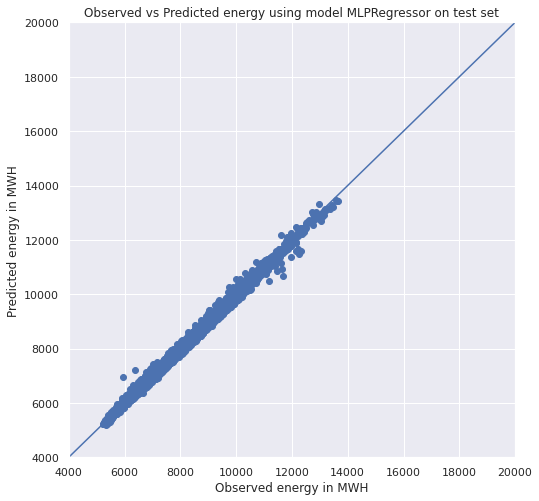

In [107]:
import sklearn
import numpy as np
from sklearn.neural_network import MLPRegressor 

def rmse(pred, actual): 
	return np.sqrt(((pred-actual)**2).mean())

# Neural Network Model
mlp_adam = MLPRegressor(hidden_layer_sizes=(200, ), activation='relu', solver='adam', alpha=0.001,max_iter=5000, tol=0)
mlp_adam.fit(X_train,y_train)
y_predicttrain = mlp_adam.predict(X_train)
y_predicttest = mlp_adam.predict(X_test)
train_rmse = rmse( y_predicttrain, y_train) 
test_rmse = rmse( y_predicttest, y_test) 

# print(train_acc, test_acc) 
#print('Train RMSE: {}\nTest RMSE: {}'.format(train_rmse, test_rmse))

_ = error_metrics(y_predicttrain, y_train, model_name='MLPRegressor for Train', test=False)
_ = error_metrics(y_predicttest, y_test, model_name='MLPRegressor for Test', test=True)
plot_ts_pred(y_test, y_predicttest, model_name='MLPRegressor on test')
plot_predvstrue_reg(y_predicttest,y_test, model_name='MLPRegressor on test set')

#### Save Prediction Output

In [108]:
# y_test.to_csv("/content/data/output_y_test.csv")
# y_predicttest.to_csv("/content/data/output_y_predicttest.csv")

np.savetxt("/content/data/output_y_test_mlpregressor.csv", y_test, delimiter=",")
np.savetxt("/content/data/output_y_predicttest_mlpregressor.csv", y_predicttest, delimiter=",")



#### Save model and output to a file

In [109]:
# df_model_output = pd.concat([X_test, y_test, y_predicttest], axis = 1)
# df_model_output = pd.concat([X_test, y_test], axis = 1)
# df_model_output.to_csv("/content/data/model_output_mlpregressor.csv")

In [110]:
# # Combined X_test, y_test, y_predicttest into one model output

# # Convert from numpy array to panda dataframd
# df_X_test = pd.DataFrame(X_test)

# # Add additional datetime index column to be kept after merge 
# df_y_test['DATETIME'] = df_y_test.index
# df_y_test

# # Merge y_test and y_predicttest
# dfs = [df_y_predicttest, df_y_test]

# df_y_diff = df_y_predicttest

# for df in dfs:
#     df_y_diff = df_y_diff.merge(df, on=['New_ID'], how='outer')

# # Calculate Diff demand
# df_y_diff['DIFFDEMAND'] = df_y_diff['TOTALDEMAND'] -  df_y_diff['TOTALDEMAND_y'] # Test - Predict

# # Set datetime column as an index
# df_y_diff = df_y_diff.set_index(['DATETIME'])

# df_y_diff

# # drop some test column
# # df_y_diff.drop(['TOTALDEMAND_x', 'New_ID', 'HELLO_x', 'HELLO_y', 'DATETIME2_x', 'TOTALDEMAND_y' ,'DATETIME2'], axis= 1, inplace= True)
# # df_y_diff.drop(['DATETIME2_y'], axis= 1, inplace= True)
# # df_y_diff.drop(['TOTALDEMAND'], axis= 1, inplace= True)
# df_y_diff

# # Merge y_test and y_predicttest and X_test
# dfs = [df_X_test, df_y_diff]

# df_diff = df_X_test

# for df in dfs:
#     df_diff = df_diff.merge(df, on=['DATETIME'], how='outer')

# df_diff
# df_diff.columns




#### Y Train vs Y Train Predict

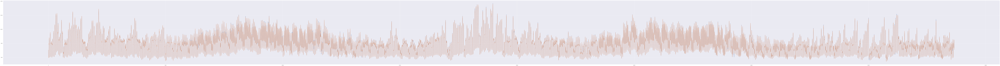

In [111]:
# Convert numpy to dataframe
df_y_predicttrain = pd.DataFrame(y_predicttrain, columns = ['TOTALDEMAND'])
df_y_predicttrain.insert(0, 'New_ID', range(0, 0 + len(df_y_predicttrain)))

# Convert to dataframe and insert new ID for join
df_y_train = pd.DataFrame(y_train, columns = ['TOTALDEMAND'])
df_y_train.insert(0, 'New_ID', range(0, 0 + len(df_y_train)))
# df_y_train

# Join train and predict output dataframes
df_y_train_plot = pd.merge(df_y_train, df_y_predicttrain, how='left', left_on='New_ID', right_on='New_ID')

# Plot Output
plt.figure(figsize=(300,20))
plt.plot(df_y_train_plot['TOTALDEMAND_x'])
plt.plot(df_y_train_plot['TOTALDEMAND_y']) # Y Predict Train

#### Y Train Y Test

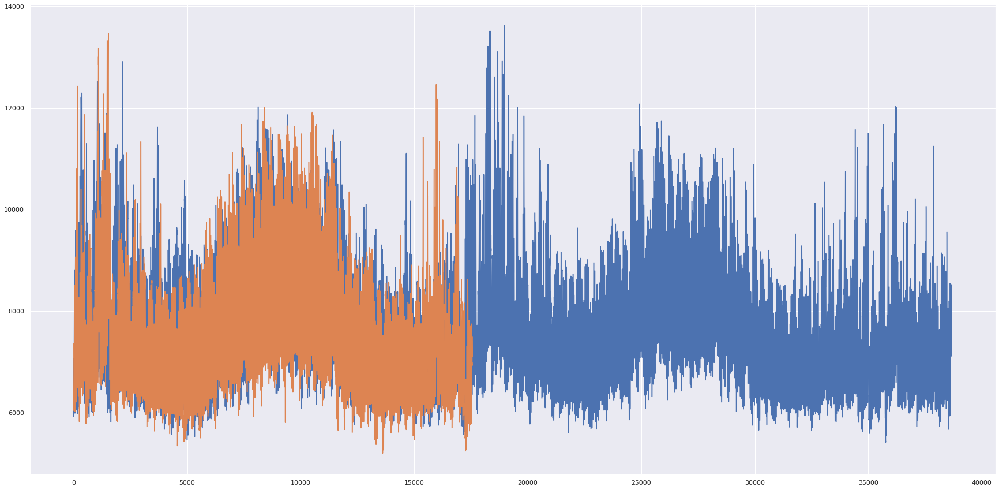

In [112]:
# Plot Output
plt.figure(figsize=(30,15))
plt.plot(y_predicttrain)
plt.plot(y_predicttest)
plt.show()

#### Y Test vs Y Test Predict

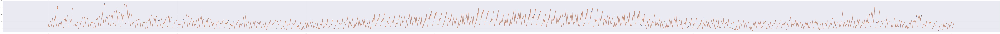

In [113]:
# Convert numpy to dataframe
df_y_predicttest = pd.DataFrame(y_predicttest, columns = ['TOTALDEMAND'])
df_y_predicttest.insert(0, 'New_ID', range(0, 0 + len(df_y_predicttest)))

# Convert to dataframe and insert new ID for join
df_y_test = pd.DataFrame(y_test, columns = ['TOTALDEMAND'])
df_y_test.insert(0, 'New_ID', range(0, 0 + len(df_y_test)))
# df_y_test

# Join test and predict output dataframes
df_y_test_plot = pd.merge(df_y_test, df_y_predicttest, how='left', left_on='New_ID', right_on='New_ID')

# Plot Output
plt.figure(figsize=(300,10))
plt.plot(df_y_test_plot['TOTALDEMAND_x'])
plt.plot(df_y_test_plot['TOTALDEMAND_y']) # Y Predict test

In [114]:
# y_train
# y_test
# y_predicttrain
y_predicttest

array([7358.52963044, 7150.93523249, 6881.53677164, ..., 7201.10143146,
       7198.57233546, 7098.95140906])

In [115]:
y_predicttrain

array([7070.06718398, 6884.43231955, 6683.95739491, ..., 7307.63794799,
       7186.39796625, 7110.43211875])

In [116]:
df_y_train

,New_ID,TOTALDEMAND
DATETIME,,
2018-01-01 00:00:00,0,7034.74
2018-01-01 00:30:00,1,6912.25
2018-01-01 01:00:00,2,6745.63
2018-01-01 01:30:00,3,6466.06
2018-01-01 02:00:00,4,6279.80
...,...,...
2021-03-17 22:00:00,38658,7419.77
2021-03-17 22:30:00,38659,7417.91
2021-03-17 23:00:00,38660,7287.32


In [117]:
df_y_train

,New_ID,TOTALDEMAND
DATETIME,,
2018-01-01 00:00:00,0,7034.74
2018-01-01 00:30:00,1,6912.25
2018-01-01 01:00:00,2,6745.63
2018-01-01 01:30:00,3,6466.06
2018-01-01 02:00:00,4,6279.80
...,...,...
2021-03-17 22:00:00,38658,7419.77
2021-03-17 22:30:00,38659,7417.91
2021-03-17 23:00:00,38660,7287.32


In [118]:
# WIP: Need to plot y_train vs y_predicttrain, y_test vs y_predicttest
# Convert from numpy array to panda dataframd
df_y_train = pd.DataFrame(y_train, columns = ['TOTALDEMAND'])
# df_y_train = df_y_train.resample('M').mean()

# df_y_train

# merge df_y_train and df_y_predicttrain the plot???
# df_y_predicttrain = pd.DataFrame(y_predicttrain, columns = ['TOTALDEMAND'])

y_predicttrain

# df_y_test = pd.DataFrame(y_test, columns = ['TOTALDEMAND'])
# df_y_test = df_y_test.resample('M').mean()

# Plot Output
# plt.figure(figsize=(30,10))
# plt.plot(df_y_train['TOTALDEMAND'])
# plt.plot(df_y_predicttrain['TOTALDEMAND'])

array([7070.06718398, 6884.43231955, 6683.95739491, ..., 7307.63794799,
       7186.39796625, 7110.43211875])

In [119]:

# # Plot RMSE
# pyplot.plot(test)
# pyplot.plot(predictions)
# pyplot.show()

### Y Test vs Y Test Predict DIFF


### Heatmap features bx DIFF > 300

In [120]:
# Convert from numpy array to panda dataframd
df_X_test = pd.DataFrame(X_test)

# Add additional datetime index column to be kept after merge 
df_y_test['DATETIME'] = df_y_test.index
df_y_test

# Merge y_test and y_predicttest
dfs = [df_y_predicttest, df_y_test]

df_y_diff = df_y_predicttest

for df in dfs:
    df_y_diff = df_y_diff.merge(df, on=['New_ID'], how='outer')

# Calculate Diff demand
df_y_diff['DIFFDEMAND'] = df_y_diff['TOTALDEMAND'] -  df_y_diff['TOTALDEMAND_y'] # Test - Predict

# Set datetime column as an index
df_y_diff = df_y_diff.set_index(['DATETIME'])

df_y_diff

# drop some test column
# df_y_diff.drop(['TOTALDEMAND_x', 'New_ID', 'HELLO_x', 'HELLO_y', 'DATETIME2_x', 'TOTALDEMAND_y' ,'DATETIME2'], axis= 1, inplace= True)
# df_y_diff.drop(['DATETIME2_y'], axis= 1, inplace= True)
# df_y_diff.drop(['TOTALDEMAND'], axis= 1, inplace= True)
df_y_diff

# Merge y_test and y_predicttest and X_test
dfs = [df_X_test, df_y_diff]

df_diff = df_X_test

for df in dfs:
    df_diff = df_diff.merge(df, on=['DATETIME'], how='outer')

# Get only Diff demand > 300
df_diff = df_diff.loc[(df_diff['DIFFDEMAND'] > 300)]
df_diff

df_diff.columns


Index(['FORECASTDEMAND_x', 'YEAR_x', 'MONTH_x', 'DAY_x', 'HOUR_x', 'MINUTE_x',
       'PUBLICHOLIDAYS_x', 'PVGeneration(MW)_x', 'HOURMINUTE_14-30_x',
       'HOURMINUTE_16-30_x', 'HOURMINUTE_18-0_x', 'HOURMINUTE_18-30_x',
       'HOURMINUTE_19-0_x', 'HOURMINUTE_2-0_x', 'HOURMINUTE_2-30_x',
       'HOURMINUTE_20-0_x', 'HOURMINUTE_20-30_x', 'HOURMINUTE_21-0_x',
       'HOURMINUTE_9-0_x', 'HOURMINUTE_9-30_x', 'DAY_NAME_Friday_x',
       'DAY_NAME_Monday_x', 'DAY_NAME_Saturday_x', 'DAY_NAME_Sunday_x',
       'DAY_NAME_Thursday_x', 'DAY_NAME_Tuesday_x', 'SEASON_autumn_x',
       'SEASON_summer_x', 'SEASON_winter_x',
       'TEMPERATURERANGES_extremelyhigh_x', 'TEMPERATURERANGES_veryhigh_x',
       'TEMPERATURERANGES_verylow_x', 'FORECASTDEMAND_y', 'YEAR_y', 'MONTH_y',
       'DAY_y', 'HOUR_y', 'MINUTE_y', 'PUBLICHOLIDAYS_y', 'PVGeneration(MW)_y',
       'HOURMINUTE_14-30_y', 'HOURMINUTE_16-30_y', 'HOURMINUTE_18-0_y',
       'HOURMINUTE_18-30_y', 'HOURMINUTE_19-0_y', 'HOURMINUTE_2-0_y',
    

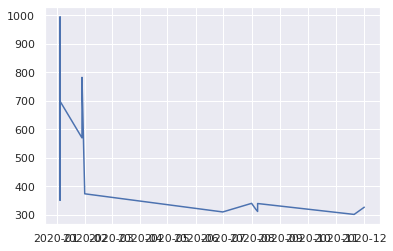

In [121]:
plt.plot(df_diff['DIFFDEMAND'])

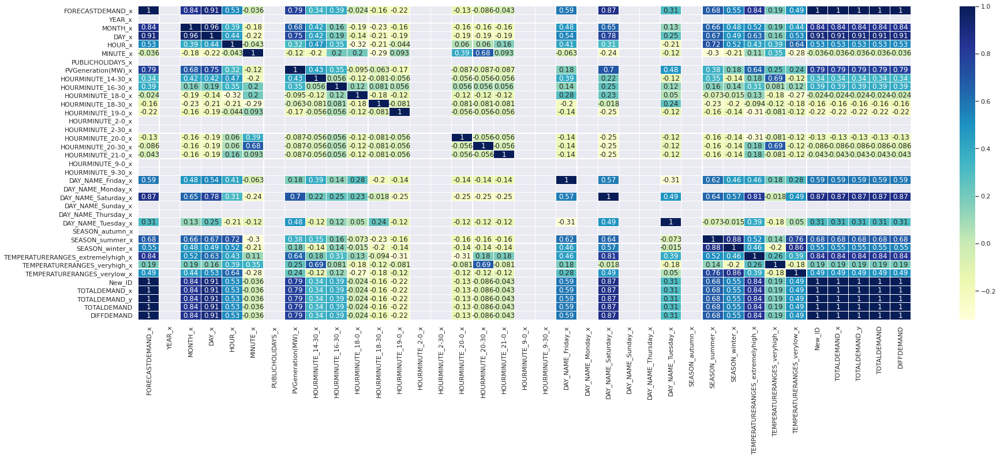

In [139]:
# Drop merged unused columns
df_diff.drop(['FORECASTDEMAND_y', 'YEAR_y', 'MONTH_y',
       'DAY_y', 'HOUR_y', 'MINUTE_y', 'PUBLICHOLIDAYS_y',
       'PVGeneration(MW)_y', 'HOURMINUTE_14-30_y', 'HOURMINUTE_16-30_y',
       'HOURMINUTE_18-0_y', 'HOURMINUTE_18-30_y', 'HOURMINUTE_19-0_y',
       'HOURMINUTE_2-0_y', 'HOURMINUTE_2-30_y', 'HOURMINUTE_20-0_y',
       'HOURMINUTE_20-30_y', 'HOURMINUTE_21-0_y', 'HOURMINUTE_9-0_y',
       'HOURMINUTE_9-30_y', 'DAY_NAME_Friday_y', 'DAY_NAME_Monday_y',
       'DAY_NAME_Saturday_y', 'DAY_NAME_Sunday_y', 'DAY_NAME_Thursday_y',
       'DAY_NAME_Tuesday_y', 'SEASON_autumn_y',
       'SEASON_summer_y', 'SEASON_winter_y',
       'TEMPERATURERANGES_extremelyhigh_y','TEMPERATURERANGES_veryhigh_y', 'TEMPERATURERANGES_verylow_y'
      #  'YEAR_x','PUBLICHOLIDAYS_x','HOURMINUTE_2-0_x','HOURMINUTE_2-30_x','HOURMINUTE_9-0_x',
      #  'DAY_NAME_Sunday_x','DAY_NAME_Thursday_x',
      #  'SEASON_autumn_x', TEMPERATURE_y
      #  'DAY_NAME_Wednesday_x', DAY_NAME_Wednesday_y, 'RRP_y', 'SEASON_spring_x','SEASON_spring_y'
       ], axis= 1, inplace= True)

# Correlation betwen features
plt.figure(figsize=(30, 10))
corr = df_diff.apply(lambda x: pd.factorize(x)[0]).corr()
ax = sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, linewidths=.2, cmap="YlGnBu", annot=True)


## LSTM

### If change features 2 places to change:
1. Reframe
reframed.drop(reframed.columns[[36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69]], axis=1, inplace=True)

2. n_train_hours
n_train_hours = 365 * 48

In [140]:
df_lstm_X = pd.concat([X_train, X_test], axis = 0)
df_lstm_y = pd.concat([y_train, y_test], axis = 0) 
df_lstm = pd.concat([df_lstm_X, df_lstm_y], axis = 1)
print(df_lstm.shape)
# X_test

(56229, 33)


In [141]:
df_lstm.columns

Index(['FORECASTDEMAND', 'YEAR', 'MONTH', 'DAY', 'HOUR', 'MINUTE',
       'PUBLICHOLIDAYS', 'PVGeneration(MW)', 'HOURMINUTE_14-30',
       'HOURMINUTE_16-30', 'HOURMINUTE_18-0', 'HOURMINUTE_18-30',
       'HOURMINUTE_19-0', 'HOURMINUTE_2-0', 'HOURMINUTE_2-30',
       'HOURMINUTE_20-0', 'HOURMINUTE_20-30', 'HOURMINUTE_21-0',
       'HOURMINUTE_9-0', 'HOURMINUTE_9-30', 'DAY_NAME_Friday',
       'DAY_NAME_Monday', 'DAY_NAME_Saturday', 'DAY_NAME_Sunday',
       'DAY_NAME_Thursday', 'DAY_NAME_Tuesday', 'SEASON_autumn',
       'SEASON_summer', 'SEASON_winter', 'TEMPERATURERANGES_extremelyhigh',
       'TEMPERATURERANGES_veryhigh', 'TEMPERATURERANGES_verylow',
       'TOTALDEMAND'],
      dtype='object')

In [142]:
from math import sqrt
from numpy import concatenate
from matplotlib import pyplot
from pandas import read_csv
from pandas import DataFrame
from pandas import concat
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
 
# convert series to supervised learning
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = DataFrame(data)
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# put it all together
	agg = concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg
 
# # load dataset
# df_model_lstm = pd.read_csv("/content/data/output.csv",header=0,infer_datetime_format=True,parse_dates=['DATETIME'],index_col=['DATETIME'])
# df_model_lstm

dataset = df_lstm 
values = dataset.values

# # Load X y
# train_X = X_train
# test_X = X_test
# train_y = y_train 
# test_y = y_test

# integer encode direction
# encoder = LabelEncoder()
# values[:,4] = encoder.fit_transform(values[:,4])
# ensure all data is float
values = values.astype('float32')
# normalize features
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(values)
print(scaled.shape)
# frame as supervised learning
reframed = series_to_supervised(scaled, 1, 1)

# debug
reframed

# drop columns we don't want to predict
# reframed.drop(reframed.columns[[18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33]], axis=1, inplace=True)
# reframed.drop(reframed.columns[[36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69]], axis=1, inplace=True)
reframed.drop(reframed.columns[[34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65]], axis=1, inplace=True) # Add temp extremely high (remove extremely low) and RRP price columns, drop DAY_NAME_WEDNESDAY and SEASON_Sprint, drop RRP price
print(reframed.head())

 

(56229, 33)
   var1(t-1)  var2(t-1)  var3(t-1)  ...  var32(t-1)  var33(t-1)   var1(t)
1   0.223746        0.0        0.0  ...         0.0    0.213875  0.201819
2   0.201819        0.0        0.0  ...         0.0    0.199430  0.177539
3   0.177539        0.0        0.0  ...         0.0    0.179781  0.156979
4   0.156979        0.0        0.0  ...         0.0    0.146812  0.131232
5   0.131232        0.0        0.0  ...         0.0    0.124847  0.116899

[5 rows x 34 columns]


(35040, 1, 33) (35040,) (21188, 1, 33) (21188,)
Epoch 1/100
161/161 - 22s - loss: 0.1034 - val_loss: 0.0766
Epoch 2/100
161/161 - 11s - loss: 0.0461 - val_loss: 0.1041
Epoch 3/100
161/161 - 11s - loss: 0.0392 - val_loss: 0.0313
Epoch 4/100
161/161 - 11s - loss: 0.0261 - val_loss: 0.0395
Epoch 5/100
161/161 - 11s - loss: 0.0259 - val_loss: 0.0354
Epoch 6/100
161/161 - 11s - loss: 0.0277 - val_loss: 0.0257
Epoch 7/100
161/161 - 11s - loss: 0.0222 - val_loss: 0.0380
Epoch 8/100
161/161 - 11s - loss: 0.0227 - val_loss: 0.0357
Epoch 9/100
161/161 - 11s - loss: 0.0252 - val_loss: 0.0276
Epoch 10/100
161/161 - 11s - loss: 0.0235 - val_loss: 0.0306
Epoch 11/100
161/161 - 11s - loss: 0.0223 - val_loss: 0.0316
Epoch 12/100
161/161 - 11s - loss: 0.0213 - val_loss: 0.0284
Epoch 13/100
161/161 - 11s - loss: 0.0215 - val_loss: 0.0258
Epoch 14/100
161/161 - 11s - loss: 0.0217 - val_loss: 0.0297
Epoch 15/100
161/161 - 11s - loss: 0.0203 - val_loss: 0.0327
Epoch 16/100
161/161 - 11s - loss: 0.0195 - va

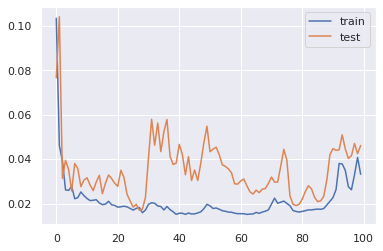

(21188, 33) (21188, 1)
(21188, 33)
Test RMSE: 524.485


In [158]:

# split into train and test sets
values = reframed.values
# n_train_hours = 365 * 48 *8
n_train_hours = 365 * 48 *2
train = values[:n_train_hours, :]
test = values[n_train_hours:, :]

# split into input and outputs
train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]
# reshape input to be 3D [samples, timesteps, features]
train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))
print(train_X.shape, train_y.shape, test_X.shape, test_y.shape)
 
# design network
model = Sequential()
# model.add(LSTM(100, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(LSTM(200,return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2]))) # TURNING.....
model.add(LSTM(200,return_sequences=True))
model.add(LSTM(200,return_sequences=True))
model.add(LSTM(200,return_sequences=True,dropout=0.5))
model.add(LSTM(200))
# model.add(Dense(1))
model.add(Dense(1))
model.compile(loss='mae', optimizer='adam')
# model.compile(loss='root_mean_squared_error_loss', optimizer='adam')
# fit network
# history = model.fit(train_X, train_y, epochs=50, batch_size=72, validation_data=(test_X, test_y), verbose=2, shuffle=False)
history = model.fit(train_X, train_y, epochs=100, batch_size=218, validation_data=(test_X, test_y), verbose=2, shuffle=False) # TURNING.....
# plot history
pyplot.plot(history.history['loss'], label='train')
pyplot.plot(history.history['val_loss'], label='test')
pyplot.legend()
pyplot.show()
 
# make a prediction
yhat = model.predict(test_X)
test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
print(test_X.shape, yhat.shape)
#debug
# test_X=test_X.reshape(1,4450314,1)

# invert scaling for forecast
inv_yhat = concatenate((yhat, test_X[:, 1:]), axis=1)
print(inv_yhat.shape)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]
# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = concatenate((test_y, test_X[:, 1:]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]
# calculate RMSE
rmse = sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)


In [144]:
# train_X.shape[1] #16
# train_X.shape[2] # tuple index out of range
train_X

array([[[0.22374564, 0.        , 0.        , ..., 0.        ,
         0.        , 0.21387494]],

       [[0.20181882, 0.        , 0.        , ..., 0.        ,
         0.        , 0.19942993]],

       [[0.17753899, 0.        , 0.        , ..., 0.        ,
         0.        , 0.17978078]],

       ...,

       [[0.11021054, 1.        , 0.        , ..., 0.        ,
         0.        , 0.14066422]],

       [[0.12547141, 1.        , 0.        , ..., 0.        ,
         0.        , 0.14846158]],

       [[0.15970486, 1.        , 0.        , ..., 0.        ,
         0.        , 0.15067506]]], dtype=float32)

### Save LSTM output to a file

In [ ]:
y_test.to_csv("/content/data/output_y_test_lstm.csv")
# yhat.to_csv("/content/data/output_y_predicttest_lstm.csv")

# np.savetxt("/content/data/output_y_test_lstm.csv", y_test, delimiter=",")
np.savetxt("/content/data/output_y_predicttest_lstm.csv", inv_y, delimiter=",")

## XGBOOST

In [148]:
# XGBoost
xgb_reg = XGBRegressor(
                 n_estimators=600,                                                                    
                 objective ='reg:linear'
                )

# Fit learning
xgb_reg.fit(X_train, y_train) 

# Prediction
y_predicttrain_xgboost = xgb_reg.predict(X_train)
y_predicttest_xgboost = xgb_reg.predict(X_test)

[13:18:56] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


### Save Predict Output to files

In [149]:
y_test.to_csv("/content/data/output_y_test_xgb.csv")
# y_predicttest.to_csv("/content/data/output_y_predicttest.csv")

# np.savetxt("/content/data/output_y_test_xgb.csv", y_test, delimiter=",")
np.savetxt("/content/data/output_y_predicttest_xgb.csv", y_predicttest_xgboost, delimiter=",")

### Metrics and Graph


Error metrics for model XGBoost for Train
RMSE or Root mean squared error: 60.24
Variance score: 1.00
Mean Absolute Error: 44.01
Mean Absolute Percentage Error: 0.55 %

Error metrics for model XGBoost for Test
RMSE or Root mean squared error: 67.35
Variance score: 1.00
Mean Absolute Error: 48.23
Mean Absolute Percentage Error: 0.62 %


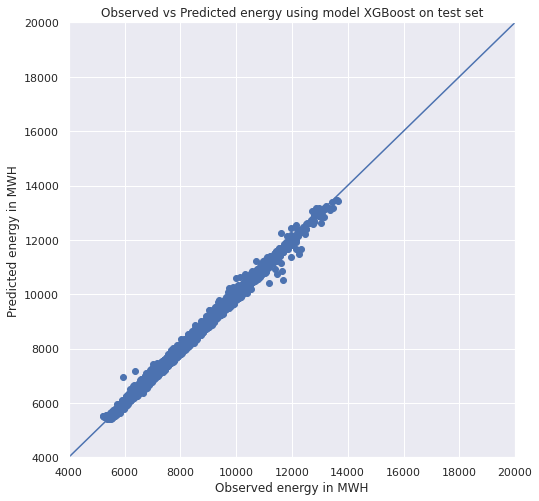

In [150]:
#train_rmse_xgboost = rmse( y_predicttrain_xgboost, y_train) 
#test_rmse_xgboost = rmse( y_predicttest_xgboost, y_test) 
# print(train_acc, test_acc) 
#print('Train RMSE: {}\nTest RMSE: {}'.format(train_rmse_xgboost, test_rmse_xgboost))

_ = error_metrics(y_predicttrain_xgboost, y_train, model_name='XGBoost for Train', test=False)
_ = error_metrics(y_predicttest_xgboost, y_test, model_name='XGBoost for Test', test=True)
plot_ts_pred(y_test, y_predicttest_xgboost, model_name='XGBoost on test')
plot_predvstrue_reg(y_predicttest_xgboost,y_test, model_name='XGBoost on test set')

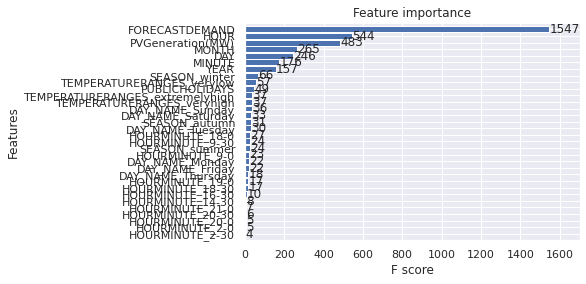

In [151]:
from xgboost import plot_importance, plot_tree
_ = plot_importance(xgb_reg, height=0.9)

In [152]:
print(xgb_reg.feature_importances_)
# xgb_reg.feature_importances_

[9.89734113e-01 2.69586744e-04 3.97713709e-04 1.78757196e-04
 1.01192249e-03 1.17260533e-04 2.61370529e-04 3.60033999e-04
 1.01653757e-04 9.73001006e-04 4.41483659e-04 2.19039313e-04
 5.71612400e-05 3.27853231e-05 3.50617367e-04 1.17316500e-04
 9.91149209e-05 3.68744040e-05 4.13494563e-04 2.02987067e-04
 1.65694335e-04 1.48325009e-04 6.84860715e-05 2.47292104e-04
 1.02489255e-04 1.69005405e-04 2.12678366e-04 6.61709229e-04
 4.59633535e-04 6.91355555e-04 1.17337168e-03 5.23583847e-04]


In [153]:
X.columns

Index(['FORECASTDEMAND', 'YEAR', 'MONTH', 'DAY', 'HOUR', 'MINUTE',
       'PUBLICHOLIDAYS', 'PVGeneration(MW)', 'HOURMINUTE_14-30',
       'HOURMINUTE_16-30', 'HOURMINUTE_18-0', 'HOURMINUTE_18-30',
       'HOURMINUTE_19-0', 'HOURMINUTE_2-0', 'HOURMINUTE_2-30',
       'HOURMINUTE_20-0', 'HOURMINUTE_20-30', 'HOURMINUTE_21-0',
       'HOURMINUTE_9-0', 'HOURMINUTE_9-30', 'DAY_NAME_Friday',
       'DAY_NAME_Monday', 'DAY_NAME_Saturday', 'DAY_NAME_Sunday',
       'DAY_NAME_Thursday', 'DAY_NAME_Tuesday', 'SEASON_autumn',
       'SEASON_summer', 'SEASON_winter', 'TEMPERATURERANGES_extremelyhigh',
       'TEMPERATURERANGES_veryhigh', 'TEMPERATURERANGES_verylow'],
      dtype='object')

### XGBoost with Param RandomGridSearch

Fitting 3 folds for each of 20 candidates, totalling 60 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.6min
[Parallel(n_jobs=-1)]: Done  60 out of  60 | elapsed:  6.1min finished


[13:26:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Best score: -4900.709698294815
Best params: 
colsample_bylevel: 1.0
colsample_bytree: 1.0
gamma: 0
learning_rate: 0.2
max_depth: 4
min_child_weight: 1.0
n_estimators: 100
subsample: 0.9

Error metrics for model Tuned XGBoost for Train
RMSE or Root mean squared error: 60.89
Variance score: 1.00
Mean Absolute Error: 44.64
Mean Absolute Percentage Error: 0.56 %

Error metrics for model Tuned XGBoost for Test
RMSE or Root mean squared error: 68.27
Variance score: 1.00
Mean Absolute Error: 48.82
Mean Absolute Percentage Error: 0.63 %


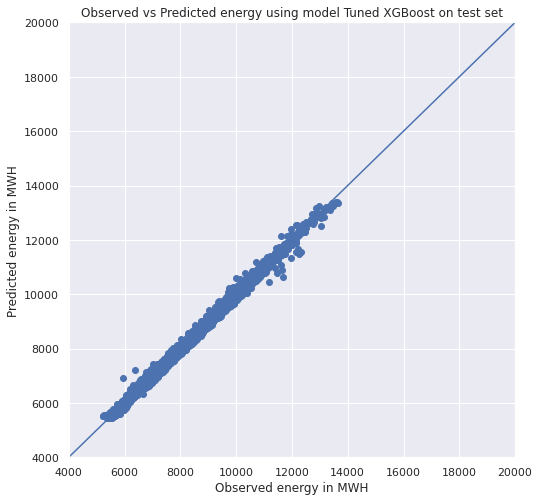

In [154]:
# Tuning the hyper parameters for the XGBoost model

xgbtuned = xgb.XGBRegressor()
param_grid = {
        'max_depth': [3, 4, 5, 6, 7, 8, 9, 10],
        'learning_rate': [0.001, 0.01, 0.1, 0.2, 0.3],
        'subsample': [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
        'colsample_bytree': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
        'colsample_bylevel': [0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
        'min_child_weight': [0.5, 1.0, 3.0, 5.0, 7.0, 10.0],
        'gamma': [0, 0.25, 0.5, 1.0],
        'n_estimators': [10, 31, 50, 100, 200, 400, 600, 1000]}

tscv = TimeSeriesSplit(n_splits=3) # special time series cross validation split
xgbtunedreg = RandomizedSearchCV(xgbtuned, param_distributions=param_grid , 
                                   scoring='neg_mean_squared_error', n_iter=20, n_jobs=-1, 
                                   cv=tscv, verbose=2, random_state=42)

xgbtunedreg.fit(X_train, y_train)
best_score = xgbtunedreg.best_score_
best_params = xgbtunedreg.best_params_
print("Best score: {}".format(best_score))
print("Best params: ")
for param_name in sorted(best_params.keys()):
    print('%s: %r' % (param_name, best_params[param_name]))

preds_boost_tuned = xgbtunedreg.predict(X_test)

# Metrics and Graph
_ = error_metrics(xgbtunedreg.predict(X_train), y_train, model_name='Tuned XGBoost for Train', test=False)
_ = error_metrics(preds_boost_tuned, y_test, model_name='Tuned XGBoost for Test', test=True)
plot_ts_pred(y_test, preds_boost_tuned, model_name='Tuned XGBoost on test')
plot_predvstrue_reg(preds_boost_tuned,y_test, model_name='Tuned XGBoost on test set')


## SARIMA

In [ ]:
df_sarima = pd.concat([X, y], axis = 1) 
sdgecyc= df_sarima
sdgecyc

In [ ]:
# pip install pmdarima

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import pmdarima as pm

# Creating the training and test datasets

# not adding year variable here because the model will use the most recent lag energy consumption values
cols_to_transform = ['TEMPERATURE', 'TOTALDEMAND']  
# sdgecyc is the dataframe with fourier series variables for hour, week and year
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test(sdgecyc, 
                                                              test_size = 0.15, scale = True, 
                                                              cols_to_transform=cols_to_transform)

# Since ARIMA model uses the past lag y values, scaling the energy values as well. 
#i.e. fit the scaler on y_train and transform it and also transform y_test using the same scaler if required later

scaler1 = StandardScaler()
y_train_lag = pd.DataFrame(scaler1.fit_transform(y_train_lag.values.reshape(-1,1)), index = y_train_lag.index, 
                           columns = ['SDGE'])

# The code below can be used to train and find the optimal SARIMAX model parameters p,q,P,Q. 
#This was run and the optimal model was found to be SARIMAX(2,1,1)x(1,0,1,24). The auto regressive term p=2 means 
#two values from the past (1 and 2 hours behind) will be used and moving average term of q=1 means 1 past term will be used as 
# the moving average term. d=1 term means the energy series will differenced once to make it stationary. 
# Seasonal period m of 24 hours here and P=Q=1 means the auto regressive term (P) and the moving average (Q) exactly 1*24 hours 
# behind will be used.

results = pm.auto_arima(y_train_lag, #data
                    d=1, # non-seasonal difference order
                    start_p=0, # initial guess for p
                    start_q=0, # initial guess for q
                    max_p=2, # max value of p to test
                    max_q=2, # max value of q to test
                    exogenous= X_train_lag, #including the exogenous variables
                    seasonal=True, # is the time series seasonal? YES
                    m = 24, # the seasonal period
                    #D=1, # seasonal difference order
                    start_P=1, # initial guess for P
                    start_Q=1, # initial guess for Q
                    max_P=1, # max value of P to test
                    max_Q=1, # max value of Q to test
                    information_criterion='aic', # used to select best model
                    trace=True, # print results whilst training
                    error_action='ignore', # ignore orders that don't work
                    stepwise=True, # apply intelligent order search
                    )
#results.fit(y_train_lag, exogenous= X_train_lag)
# Got the optimal SARIMAX order from running the above auto_arima function. It took more than 2 hours to get the optimal...
#...solution. So, just using the final values here
model_opt = SARIMAX(y_train_lag, order=(2,1,1), seasonal_order=(1, 0, 1, 24), exog = X_train_lag, trend='c')
results = model_opt.fit()
# plotting the residuals and checking if they meet the i.i.d (independent and identically distributed) requirements
_ = results.plot_diagnostics(figsize=(12, 7))


# Calculate Target Accuracy
Calculat RMSE on Forcast and Total from complete dataset

In [ ]:

#targetaccuracy = rmse(forecast,total)
targetaccuracy = rmse(df_final['FORECASTDEMAND'],df_final['TOTALDEMAND'])
print(targetaccuracy)
# RMSE: 85.87  (including pre-2012)
# RMSE: 77.67 (excluding pre-2012)

## Other sandpit models
* Linear regression
* Keras
* Pytorch

In [ ]:

# from sklearn.linear_model import LinearRegression
# from sklearn.metrics import mean_squared_error

# #reg = LinearRegression().fit(X_train, y_train["TOTALDEMAND"])
# reg = LinearRegression().fit(X_train, y_train)
# y_train_pred = reg.predict(X_train)
# y_test_pred = reg.predict(X_test)

# RMSE_train = np.sqrt(mean_squared_error(y_train['TOTALDEMAND'], p_train))
# RMSE_test = np.sqrt(mean_squared_error(y_test['TOTALDEMAND'], p_test))

# print('Train RMSE: {}\nTest RMSE: {}'.format(RMSE_train, RMSE_test) )

In [ ]:

def summarized_scores(name,score,scores):
    s_scores=', '.join(['%.1f'%s for s in scores])
    print('%s:[%.3f] %s'%(name,score,s_scores))

In [ ]:

def to_supervized(train,n_in,n_out):
    data=train.reshape((train.shape[0]*train.shape[1],train.shape[2]))
    X,y=[],[]
    in_start=0
    for i in range(len(data)):
        in_end=in_start+n_in
        out_end=in_end+n_out
        if out_end<len(data):
            x_in=data[in_start:in_end,0]
            x_in=x_in.reshape((len(x_in),1))
            X.append(x_in)
            y.append(data[in_end:out_end,0])
        in_start+=1
    return np.array(X),np.array(y)

In [ ]:

from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import LSTM

In [ ]:

def build_model(train,n_input):
    train_x,train_y=to_supervized(train,n_input,7)
    verbose=0
    epochs=70
    batch_size=16
    n_timesteps=train_x.shape[1]
    n_features=train_x.shape[2]
    n_outputs=train_y.shape[1]
    model=Sequential()
    model.add(LSTM(200,activation='relu',input_shape=(n_timesteps,n_features)))
    model.add(Dense(100,activation='relu'))
    model.add(Dense(n_outputs))
    model.compile(loss='mse',optimizer='adam')
    model.fit(train_x,train_y,epochs=epochs,batch_size=batch_size,verbose=verbose)
    return model

In [ ]:

def forecast(model,history,n_input):
    data=np.array(history)
    data=data.reshape((data.shape[0]*data.shape[1],data.shape[2]))
    in_x=data[-n_input:,0]
    in_x=in_x.reshape((1,len(in_x),1))
    yhat=model.predict(in_x,verbose=0)
    return yhat[0]

In [ ]:

def evaluate_model(train,test,n_input):
    model=build_model(train,n_input)
    history=[x for x in train]
    prediction=[]
    for i in range(len(test)):
        yhat_s=forecast(model,history,n_input)
        prediction.append(yhat_s)
        history.append(test[i,:])
    prediction=np.array(prediction)
    score,scores=forecasts(test[:,:,0],prediction)
    return score,scores

In [ ]:

# X = df_forecast
# y = 
# # Split train and test data
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size= 0.2, random_state= 25)

# train,test=split(df_final.values)

# WIP (Work in progress)
2. Plot predicted output
3. No onehot for LSTM
4. Add LSTM model
5. Add GRU model

#TO DO!!!
1. Add business hours feature, low/medium/ 
2. Add colours to V shape group for weekday and weekend = DONE
3. get the date and time of the top 100 biggest errors ? 
4. Bushfire events = view, not match
5. Solar data - James
6. Daylight data
7. Cloud cover data - https://www.earthenv.org/cloud
8. Need to group business hour?
9. Regression for significances

# DONE
1. Add season/quarter feature = DONE (not improve RMSE)
2. High, low temperature = = DONE (small improvement of RMSE)
3. One hot encoding a version of “hour” or “30”mins = DONE (improve RMSE from 75 to 74.77)
4. Get baseslines RMSE = 75
5. Add public holidays
6. Add public holidays work day, non-weekday as categorical
7. Train test split by date ranges, not random

In [ ]:

# # Generate 'business hour' feature

# for i in range(len(df_forecast)):
#     position = df_forecast.index[i]
#     hour = position.hour
#     if ((hour > 8 and hour < 12) or (hour > 14 and hour < 21)):
#         df_forecast.loc[position, 'business hour'] = 2
#     elif (hour >= 12 and hour <= 14):
#         df_forecast.loc[position, 'business hour'] = 1
#     else:
#         df_forecast.loc[position, 'business hour'] = 0